In [1]:
# Straxen Get Context 
import straxen
# In case im running on my own devices rather than midway/dali
local = True
if local:
    _database_init = True
    we_are_the_daq = False
    output_folder = "/Code/strax_data"
    include_rucio_remote = False
    include_online_monitor = False
    include_rucio_local = True
    download_heavy = False
    _auto_append_rucio_local = False
    _rucio_path = "/Code/strax_data/rucio"
    _rucio_local_path = "/Code/strax_data/rucio"
    _raw_paths = "/Code/strax_data/rucio"
    _processed_paths = ["/Code/strax_data"]

    ### Online Modified for local
    st = straxen.contexts.xenonnt_online(   _database_init              = _database_init,
                                            we_are_the_daq              = we_are_the_daq,
                                            output_folder               = output_folder,
                                            include_rucio_remote        = include_rucio_remote,
                                            include_online_monitor      = include_online_monitor,
                                            include_rucio_local         = include_rucio_local,
                                            download_heavy              = download_heavy,
                                            _auto_append_rucio_local    = _auto_append_rucio_local,
                                            _rucio_path                 = _rucio_path,
                                            _rucio_local_path           = _rucio_local_path,
                                            _raw_paths                  = _raw_paths,
                                            _processed_paths            = _processed_paths,)
else:
    st = straxen.contexts.xenonnt_online(include_rucio_remote=True, download_heavy=True)

2025-01-10 10:03:18,782 - admix - WARNING - Initializing utilix DB failed. You cannot do database operations


DB initialization failed


In [7]:
import os 

dataset = {}
run_ids = []
for j in os.listdir('/Code/processed_data/'):
    if os.path.isdir(os.path.join('/Code/processed_data/', j)):
        for i in os.listdir(os.path.join('/Code/processed_data/', j)):
            if '0' == i[0]:
                run_ids.append(i.split('.')[0])
livetime = st.select_runs(run_id=run_ids).livetime.sum()
livetime, len(run_ids)

Checking data availability:   0%|          | 0/2 [00:00<?, ?it/s]

(Timedelta('11 days 14:47:08.846000'), 244)

In [12]:
import pandas
file_path = "/Code/processed_data/all_data.pkl.gz"
dat = pandas.read_pickle(file_path, compression="gzip")

In [13]:
dat.shape

(7990690, 163)

In [18]:
sum(dat['filter'])

3321130

In [14]:
dat[dat.Source=='Kr'].shape

(1314843, 163)

# Filtering Krypton Data

Use self processed data and filter to make hdf5 file, see ./README.md for more
information

Note that running this takes for 131 datasets ~ 70GB of ram (I use a lot of 
swap space) but should be easy enough to significantly reduce this 

In [1]:
import os
os.environ["XENON_CONFIG"] = '/Code/xenon.config'
import straxen

2024-12-18 13:59:48,800 - admix - WARNING - Initializing utilix DB failed. You cannot do database operations


DB initialization failed


In [3]:
# Straxen Filter Plugin ----> TODO Untested
import strax

class KrS2LCEFitFilter(strax.CutPlugin):
    """
    Plugin To filter data for Fitting an LCE map
    - Author: Felix Semler
    - Supervisor : Jelle Aalbers
    Reference:
    - Link Note
    Implemented : TODO: Date of completion
    ----------------------------------------------------------------------------
    Filters for:
    Valid Krypton Single Scatters
    Z depth

    TODO Check if alt/ main & reconst algo disagreement & Nan required <- done by cut Kr SingleS1S2
    Also check if Saturated is necessary

    Note to run this one requires -> GIve CPU / RAM req due to peaks and high level data not being available
    """

    depends_on = ("event_info", "cut_Kr_SingleS1S2", "event_area_per_channel")
    provides = "KrS2LCEFitData"
    cut_name = "KrS2LCEFitFilter"
    cut_description = "Filter for fitting S2 LCE -> Returns data directly not the mask"
    __verseion__ = '0.0.1'

    z_depth = straxen.URLConfig(
        default = (0,-10),
        help = "Event Depth Filter",
    )

    #TODO: How use cut -> I think it just passes depends-on to cut_by?
    # Also figure out how to run this on server

    def cut_by(self, event_info, KrSingleCut, event_area_per_channel):
        mask = KrSingleCut
        mask &= (event_info['z'] <= self.z_depth[0]) & (event_info['z'] >= self.z_depth[1])
        return event_info[mask,:], event_area_per_channel[mask,:]    

In [3]:
# imports
import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import tensorflow
import scipy
import keras
from IPython.display import clear_output
from functools import partial
import h5py

os.getcwd()

2024-12-18 13:59:57.964260: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-12-18 13:59:57.987859: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2024-12-18 13:59:58.150243: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-18 13:59:58.150343: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-18 13:59:58.172567: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to

'/Code'

In [2]:
# Straxen Get Context 

# In case im running on my own devices rather than midway/dali
local = True
if local:
    _database_init = True
    we_are_the_daq = False
    output_folder = "/Code/strax_data"
    include_rucio_remote = False
    include_online_monitor = False
    include_rucio_local = True
    download_heavy = False
    _auto_append_rucio_local = False
    _rucio_path = "/Code/strax_data/rucio"
    _rucio_local_path = "/Code/strax_data/rucio"
    _raw_paths = "/Code/strax_data/rucio"
    _processed_paths = ["/Code/strax_data"]

    ### Online Modified for local
    st = straxen.contexts.xenonnt_online(   _database_init              = _database_init,
                                            we_are_the_daq              = we_are_the_daq,
                                            output_folder               = output_folder,
                                            include_rucio_remote        = include_rucio_remote,
                                            include_online_monitor      = include_online_monitor,
                                            include_rucio_local         = include_rucio_local,
                                            download_heavy              = download_heavy,
                                            _auto_append_rucio_local    = _auto_append_rucio_local,
                                            _rucio_path                 = _rucio_path,
                                            _rucio_local_path           = _rucio_local_path,
                                            _raw_paths                  = _raw_paths,
                                            _processed_paths            = _processed_paths,)
else:
    st = straxen.contexts.xenonnt_online(include_rucio_remote=True, download_heavy=True)

In [6]:
# Get data from the HDF5 files
def get_hdf5(path):
    with h5py.File(path, 'r') as f:
        pat = f['event_area_per_channel'][:]
        ei = f['event_info'][:]
    assert len(pat) == len(ei)
    return pat, ei

hdf5_path = '/Code/processed_data/Krypton/'
dataset = {}
run_ids = []
for i in os.listdir(hdf5_path):
    if '0' == i[0]:
        try:
            pat,ei = get_hdf5(os.path.join(hdf5_path, i))
            run_ids.append(i.split('.')[0])
            dataset[i.split('.')[0]] = [pat, ei]
        except Exception as e:
            print(i)
            print(e)

        

KeyboardInterrupt: 

In [6]:
livetime = st.select_runs(run_id=run_ids).livetime.sum()
livetime

Checking data availability:   0%|          | 0/2 [00:00<?, ?it/s]

/opt/XENONnT/anaconda/envs/XENONnT_el9.2024.10.4/lib/python3.9/site-packages/straxen/config/preprocessors.py:16: UserWarning: From straxen version 2.1.0 onward, URLConfig parameters will be sorted alphabetically before being passed to the plugins, this will change the lineage hash for non-sorted URLs. To load data processed with non-sorted URLs, you will need to use an older version.
  warnings.warn(


Timedelta('2 days 17:30:43.858000')

### Post Krypton Cut file - We cut in the beginning - Z is done later

In [11]:
# This only contains true values... So i need to filter by timestamps
kr_cut = np.load('/Code/processed_data/Krypton/cut_Kr_SingleS1S2.npz')['data']

In [12]:
fdata = {}
for key in dataset:
    # Select subset of run_ids
    #tmp = kr_cut[kr_cut['run_id'] == key]
    #time_mask = np.isin(dataset[key][1]['time'], tmp['time'])
    #fdata[key] = [dataset[key][0][time_mask], dataset[key][1][time_mask]]
    fdata[key] = [dataset[key][0], dataset[key][1]]

del dataset#, kr_cut

In [13]:
ei = np.concatenate([fdata[i][1] for i in fdata.keys()])
#ei = pd.DataFrame(ei)
ei.dtype = fdata[list(fdata.keys())[0]][1].dtype
patterns = np.concatenate([fdata[i][0] for i in fdata.keys()])
assert len(patterns) == ei.shape[0]


# Get meta
pmt_pos = straxen.pmt_positions()
pmt_pos_top = pmt_pos[pmt_pos.array == "top"].to_numpy()
dead_pmts = np.argwhere(patterns['s2_area_per_channel'][:,:len(pmt_pos_top)].mean(axis=0) == 0).reshape(-1)
not_dead_pmts = np.argwhere(patterns['s2_area_per_channel'][:,:len(pmt_pos_top)].mean(axis=0) != 0).reshape(-1)
n_pmts = pmt_pos_top.shape[0]
patterns_sub = patterns['s2_area_per_channel'][:, :n_pmts]

del fdata

### Pre Krypton Cut File 
Outdated

In [7]:
# Concatenate all data
ei = np.concatenate([dataset[i][1] for i in dataset.keys()])
#ei = pd.DataFrame(ei)
ei.dtype = dataset[list(dataset.keys())[0]][1].dtype
patterns = np.concatenate([dataset[i][0] for i in dataset.keys()])
assert len(patterns) == ei.shape[0]

# Get meta
pmt_pos = straxen.pmt_positions()
pmt_pos_top = pmt_pos[pmt_pos.array == "top"].to_numpy()
dead_pmts = np.argwhere(patterns['s2_area_per_channel'][:,:len(pmt_pos_top)].mean(axis=0) == 0).reshape(-1)
not_dead_pmts = np.argwhere(patterns['s2_area_per_channel'][:,:len(pmt_pos_top)].mean(axis=0) != 0).reshape(-1)
n_pmts = pmt_pos_top.shape[0]
patterns_sub = patterns['s2_area_per_channel'][:, :n_pmts]
del dataset

##  Data Exploration

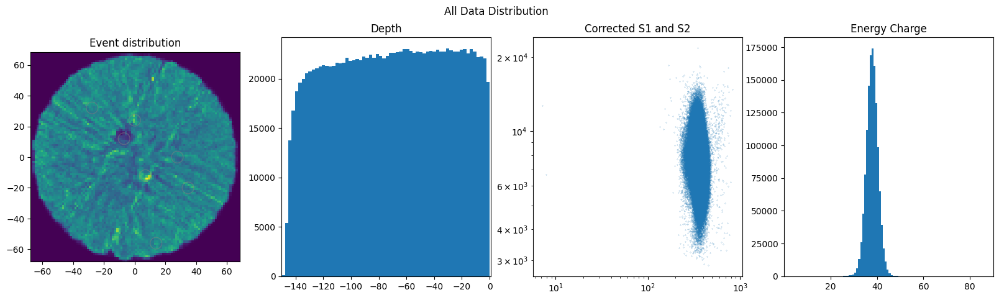

In [38]:
fig, ax = plt.subplots(1,4 , figsize= (20,5))
ax = ax.flatten()

ax[0].set_title('Event distribution')
_x, _y  = ei['x'], ei['y']
_bool_map = ~(np.isnan(_x) | np.isnan(_y))
heatmap_data, x_edges, y_edges = np.histogram2d(_x[_bool_map],_y[_bool_map], bins=100)
# Plot the heatmap using imshow
img = ax[0].imshow(heatmap_data.T, extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], origin='lower', cmap='viridis')
for i in dead_pmts:
        circle = plt.Circle((pmt_pos_top[i,-2], pmt_pos_top[i,-1]),  3  * 2.54 / 2, color='grey', alpha = 0.5, fill=False)
        ax[0].add_artist(circle)
#cbar = plt.colorbar(img, ax=ax[0], orientation='vertical')
ax[1].set_title('Depth')
ax[1].hist(ei['z'], bins = 100)
ax[1].set_xlim(-150, 1)
ax[2].set_title('Corrected S1 and S2')
ax[2].scatter(ei['cs1'], ei['cs2'], marker = '.',s=0.1)
ax[2].set_xscale('log')
ax[2].set_yscale('log')
ax[3].set_title('Energy Charge')
ax[3].hist(ei['e_ces'], bins = 100) 
#ax[3].set_xlim(0, np.mean(ei['e_ces'])+5*np.std(ei['e_ces']))
fig.suptitle("All Data Distribution")

plt.show()

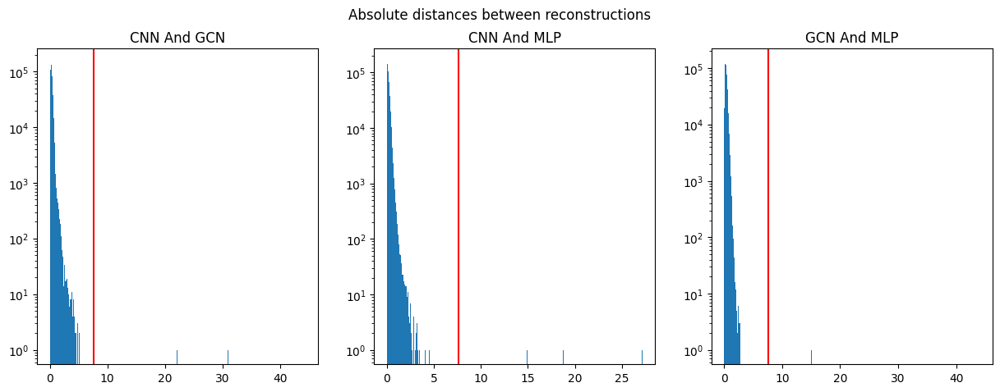

In [39]:
# Check distances between position predictions
fig, ax = plt.subplots(1,3, figsize=(15,5))
ax = ax.flatten()
bins = 1000
# TODO Replot after all filters except for agreeance, makes it much clearer
ax[0].set_title("CNN And GCN")
ax[0].hist(((ei["s2_x_cnn"] - ei["s2_x_gcn"])**2 + (ei["s2_y_cnn"] - ei["s2_y_gcn"])**2)**(1/2), bins=bins )
ax[0].axvline(2*straxen.tpc_pmt_radius,c='r')

ax[1].set_title("CNN And MLP")
ax[1].hist(((ei["s2_x_cnn"] - ei["s2_x_mlp"])**2 + (ei["s2_y_mlp"] - ei["s2_y_mlp"])**2)**(1/2), bins=bins )
ax[1].axvline(2*straxen.tpc_pmt_radius,c='r')

ax[2].set_title("GCN And MLP")
ax[2].hist(((ei["s2_x_gcn"] - ei["s2_x_mlp"])**2 + (ei["s2_y_gcn"] - ei["s2_y_mlp"])**2)**(1/2), bins=bins )
ax[2].axvline(2*straxen.tpc_pmt_radius,c='r')

for i in ax: i.set_yscale('log')
fig.suptitle("Absolute distances between reconstructions")
fig.show()


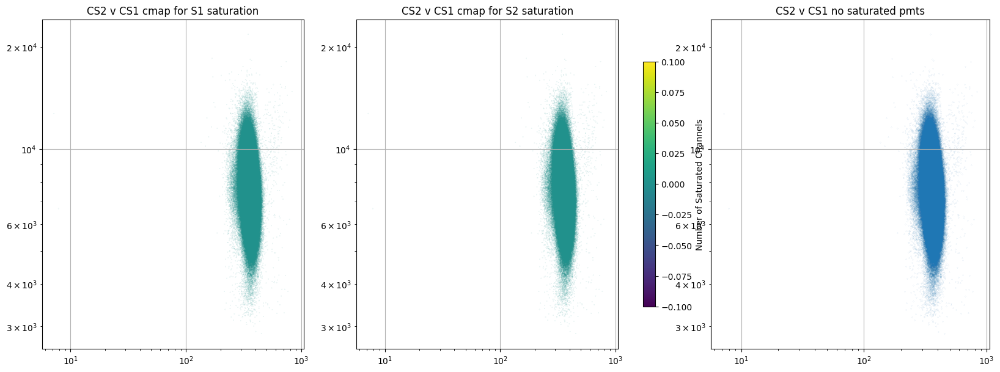

In [43]:
# Saturated PMTs
import matplotlib.colors as mcolors
combined_saturation = np.concatenate([ei["s1_n_saturated_channels"], ei["s2_n_saturated_channels"]])
norm = mcolors.Normalize(vmin=combined_saturation.min(), vmax=combined_saturation.max())

fig, ax = plt.subplots(1,3, figsize = (20,7))
ax = ax.flatten()

ax[0].grid()
sc1 =ax[0].scatter(ei["cs1"], ei["cs2"], c=ei["s1_n_saturated_channels"],norm=norm, marker = ".", s=0.01)
ax[0].set_title("CS2 v CS1 cmap for S1 saturation")
ax[0].set_xscale('log')
ax[0].set_yscale('log')

ax[1].grid()
sc2 =ax[1].scatter(ei["cs1"], ei["cs2"], c=ei["s2_n_saturated_channels"], norm=norm,marker = ".", s=0.01)
ax[1].set_title("CS2 v CS1 cmap for S2 saturation")
ax[1].set_xscale('log')
ax[1].set_yscale('log')

ax[2].grid()
ax[2].scatter(ei["cs1"][ei["s1_n_saturated_channels"]+ei["s2_n_saturated_channels"] ==0], ei["cs2"][ei["s1_n_saturated_channels"]+ei["s2_n_saturated_channels"] ==0], marker = ".", s=0.01)
ax[2].set_title("CS2 v CS1 no saturated pmts")
ax[2].set_xscale('log')
ax[2].set_yscale('log')
cbar = fig.colorbar(sc1, ax=ax[:2], orientation="vertical", fraction=0.02, pad=0.04)
cbar.set_label("Number of Saturated Channels")

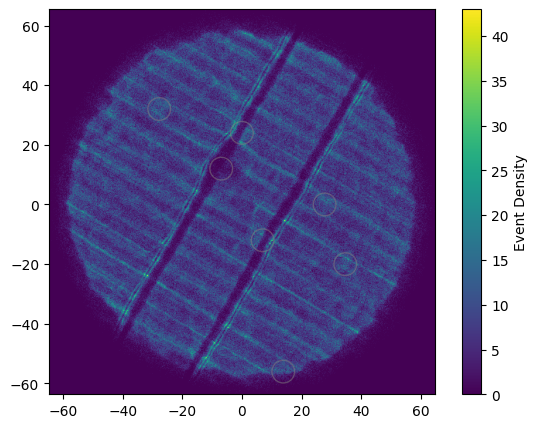

In [12]:
import matplotlib.pyplot as plt
import numpy as np

# Create a single subplot
fig, ax = plt.subplots(figsize=(7, 5))

# Set the title for the plot

# Sample data for demonstration (replace with your actual data)
_x, _y = ei['s2_x'], ei['s2_y']
_bool_map = ~(np.isnan(_x) | np.isnan(_y))

# Generate the 2D histogram data
heatmap_data, x_edges, y_edges = np.histogram2d(_x[_bool_map], _y[_bool_map], bins=500)

# Plot the heatmap using imshow
img = ax.imshow(heatmap_data.T, extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], origin='lower', cmap='viridis')

# Add circles for each dead PMT position
for i in dead_pmts:
    circle = plt.Circle((pmt_pos_top[i, -2], pmt_pos_top[i, -1]), 3 * 2.54 / 2, color='grey', alpha=0.5, fill=False)
    ax.add_artist(circle)

# Display the plot
plt.colorbar(img, ax=ax, label="Event Density")
plt.show()


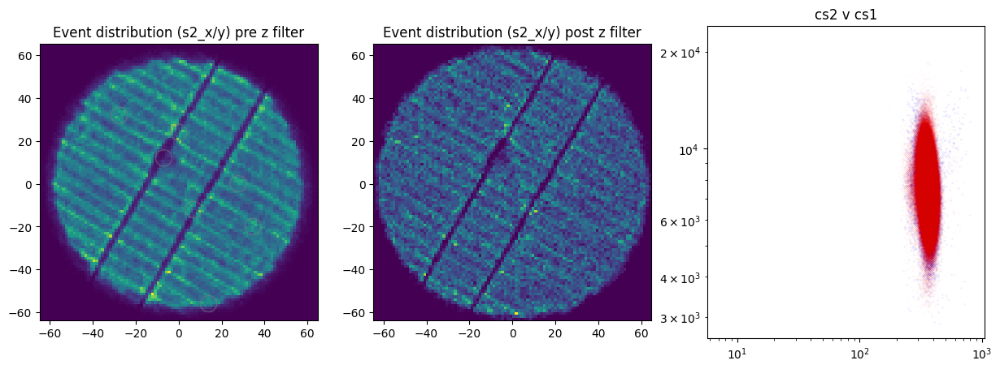

In [50]:
fig, ax = plt.subplots(1,3 , figsize= (15,5))
ax = ax.flatten()

ax[0].set_title('Event distribution (s2_x/y) pre z filter')
_x, _y  = ei['s2_x'], ei['s2_y']
_bool_map = ~(np.isnan(_x) | np.isnan(_y))
heatmap_data, x_edges, y_edges = np.histogram2d(_x[_bool_map],_y[_bool_map], bins=100)
# Plot the heatmap using imshow
img = ax[0].imshow(heatmap_data.T, extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], origin='lower', cmap='viridis')
for i in dead_pmts:
        circle = plt.Circle((pmt_pos_top[i,-2], pmt_pos_top[i,-1]),  3  * 2.54 / 2, color='grey', alpha = 0.5, fill=False)
        ax[0].add_artist(circle)
_bool_map &= (ei["z"] >= -10)
heatmap_data, x_edges, y_edges = np.histogram2d(_x[_bool_map],_y[_bool_map], bins=100)
ax[1].set_title('Event distribution (s2_x/y) post z filter')
img = ax[1].imshow(heatmap_data.T, extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], origin='lower', cmap='viridis')

ax[2].set_title('cs2 v cs1')
ax[2].scatter(ei["cs1"][_bool_map], ei["cs2"][_bool_map],label='remains',c='b',marker = ".", s=0.01)
ax[2].scatter(ei["cs1"][~_bool_map], ei["cs2"][~_bool_map],label='removed',c='r',marker = ".", s=0.01, alpha=0.3)
ax[2].set_xscale('log')
ax[2].set_yscale('log')


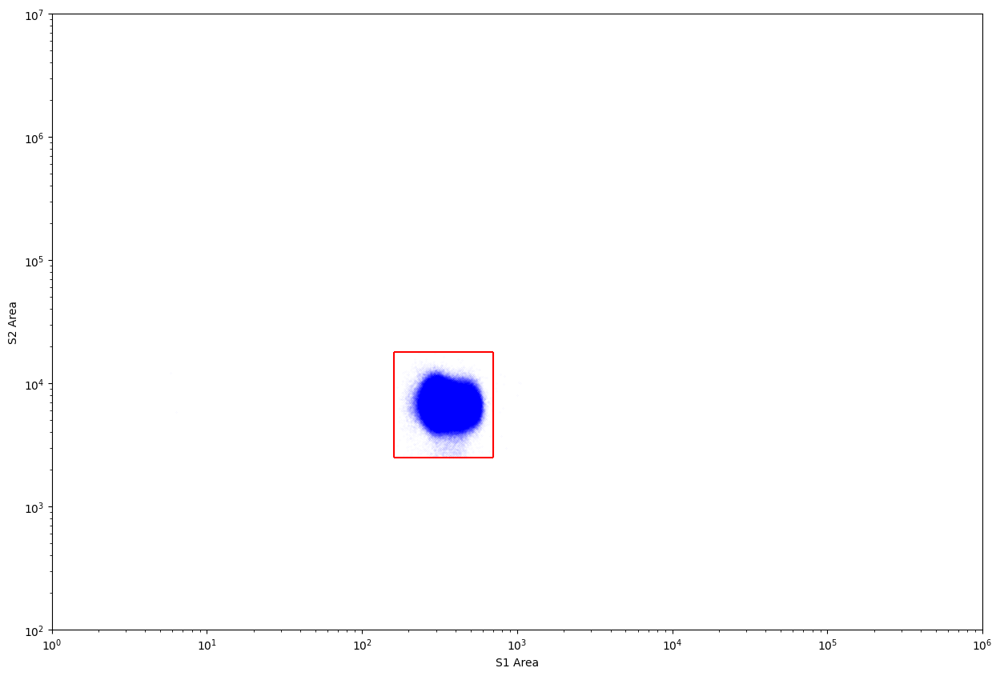

In [51]:
# Box Cut
fig = plt.figure(figsize=(15,10))
plt.scatter(ei["s1_area"], ei["s2_area"],label='remains',c='b',marker = ".", s=0.001)
plt.xlim(1e0, 1e6)
plt.ylim(1e2, 1e7)
plt.xscale('log')
plt.yscale('log')
plt.xlabel("S1 Area")
plt.ylabel("S2 Area")
# From cutax sr2
y_corner = [2500, 18000]
x_corner = [160, 700]
plt.vlines(x_corner, *y_corner, color='r')
plt.hlines(y_corner, *x_corner, color='r')

## Actual Data Filtering - Pre Cut File

In [8]:
# Filter data 
dat_rem = []
# Non nan pos
bool_map_datafilter = ~(np.isnan(ei["x"]) | np.isnan(ei["y"]))
dat_rem.append(['Non NaN', bool_map_datafilter.mean()])

# Remove saturated ? ei.s1_n_saturated_channels
bool_map_datafilter = ((ei["s1_n_saturated_channels"] == 0) & (ei["s2_n_saturated_channels"] == 0)) # (ei.s2_n_saturated_channels == 0) #
dat_rem.append(['Saturated', bool_map_datafilter.mean()])

# We want top 10cm 

# Filter for distance of pmt to event site
# Removes extreme chi squared values mainly less than 1 
#bool_map_datafilter &= ((((pmt_pos_top[:,2:][patterns[:,:n_pmts].argmax(axis=1)] - ei[['x', 'y']].to_numpy()) ** 2).sum(axis=1))**(1/2) < 10)
#dat_rem.append(['pmt event distance', bool_map_datafilter.mean()])

# no large secondaries -> Number based on gaussian fit 
bool_map_datafilter &= (ei["alt_cs2"] / ei["cs2"] < 0.04) 
dat_rem.append(['alt/prim', bool_map_datafilter.mean()])

# CS1 CS2 Box
bool_map_datafilter &= ((ei["s1_area"] > 160) & (ei["s1_area"] < 700)) & ((ei["s2_area"] > 2500) & (ei["s2_area"] < 18000))
dat_rem.append(['cS1 cS2 box', bool_map_datafilter.mean()])

# MLP CNN GCN Agreeance
pmt_diam = 2*straxen.tpc_pmt_radius
bool_map_datafilter &= (((ei["s2_x_cnn"] - ei["s2_x_gcn"])**2 + (ei["s2_y_cnn"] - ei["s2_y_gcn"])**2)**(1/2) < pmt_diam)
bool_map_datafilter &= (((ei["s2_x_cnn"] - ei["s2_x_mlp"])**2 + (ei["s2_y_mlp"] - ei["s2_y_mlp"])**2)**(1/2) < pmt_diam)
bool_map_datafilter &= (((ei["s2_x_gcn"] - ei["s2_x_mlp"])**2 + (ei["s2_y_gcn"] - ei["s2_y_mlp"])**2)**(1/2) < pmt_diam)
dat_rem.append(['Pos Pred Agree', bool_map_datafilter.mean()])

# Only 35 datapoints allowed (2 outer rings of main site) to be >= 10% of max datapoint
# Forget if this was effective  -> 17 (two rings) removes pointless
# bool_map_datafilter &= (((patterns[:,:n_pmts] / patterns[:,:n_pmts].max(axis=1).reshape(-1, 1)) > 0.1).sum(axis=1) <= 35)
# dat_rem.append(['Area around site', bool_map_datafilter.mean()])

z_lim = -20
bool_map_datafilter &=  (ei["z"] >= z_lim)
dat_rem.append(['z', bool_map_datafilter.mean()])


ei = ei[bool_map_datafilter]
patterns = patterns[bool_map_datafilter]
# Info
assert len(patterns) == ei.shape[0]
print("{:15} : {:15}  : {:15}".format("Filter", "Cumul. %", "Data Points"))
print("-"*(45+7))
for i in dat_rem:
    print("{:15} : {:15}% : {:15}".format(i[0], int(i[1]*100), int(i[1]*len(bool_map_datafilter))))
print("-"*(45+7))

print("Data qualified: {}% == {} datapoints".format(int(bool_map_datafilter.mean()*100), ei.shape[0]))


Filter          : Cumul. %         : Data Points    
----------------------------------------------------
Non NaN         :              90% :         2745187
Saturated       :              83% :         2546851
alt/prim        :              68% :         2087492
cS1 cS2 box     :              55% :         1697097
Pos Pred Agree  :              55% :         1696479
z               :               7% :          234696
----------------------------------------------------
Data qualified: 7% == 234696 datapoints


## Z filter

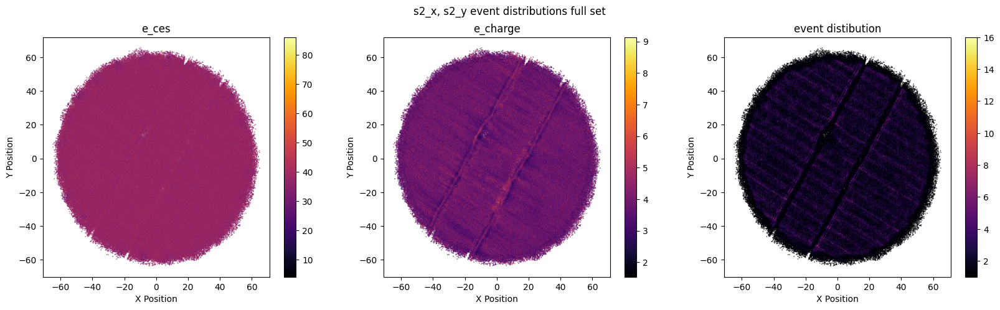

In [89]:
fig, ax =plt.subplots(1,3,figsize=(20, 5))
hb = ax[0].hexbin(ei['s2_x'], ei['s2_y'], C=ei['e_ces'], gridsize=1000, cmap='inferno', mincnt=1)

# Add a color bar to indicate values
cb = plt.colorbar(hb, ax=ax[0])
ax[0].set_title('e_ces')
ax[0].set_xlabel('X Position')
ax[0].set_ylabel('Y Position')
#ax[0].grid()

hb = ax[1].hexbin(ei['s2_x'], ei['s2_y'], C=ei['e_charge'], gridsize=1000, cmap='inferno', mincnt=1)
# Add a color bar to indicate values
cb = plt.colorbar(hb, ax=ax[1])
ax[1].set_title('e_charge')
ax[1].set_xlabel('X Position')
ax[1].set_ylabel('Y Position')
#ax[1].grid()

hb = ax[2].hexbin(ei['s2_x'], ei['s2_y'], gridsize=1000, cmap='inferno', mincnt=1)
# Add a color bar to indicate values
cb = plt.colorbar(hb, ax=ax[2])
ax[2].set_title('event distibution')
ax[2].set_xlabel('X Position')
ax[2].set_ylabel('Y Position')
#ax[2].grid()
fig.suptitle("s2_x, s2_y event distributions full set")


plt.show()

In [90]:
bool_map_datafilter = ei['z'] > -20

ei = ei[bool_map_datafilter]
patterns = patterns[bool_map_datafilter]

bool_map_datafilter.sum(), bool_map_datafilter.mean(), bool_map_datafilter.size

(184657, 0.14044023473507122, 1314844)

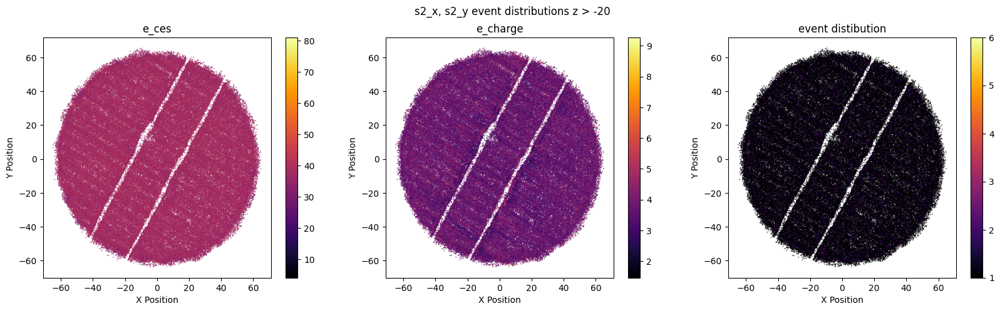

In [93]:
fig, ax =plt.subplots(1,3,figsize=(20, 5))
hb = ax[0].hexbin(ei['s2_x'], ei['s2_y'], C=ei['e_ces'], gridsize=1000, cmap='inferno', mincnt=1)

# Add a color bar to indicate values
cb = plt.colorbar(hb, ax=ax[0])
ax[0].set_title('e_ces')
ax[0].set_xlabel('X Position')
ax[0].set_ylabel('Y Position')
#ax[0].grid()

hb = ax[1].hexbin(ei['s2_x'], ei['s2_y'], C=ei['e_charge'], gridsize=1000, cmap='inferno', mincnt=1)
# Add a color bar to indicate values
cb = plt.colorbar(hb, ax=ax[1])
ax[1].set_title('e_charge')
ax[1].set_xlabel('X Position')
ax[1].set_ylabel('Y Position')
#ax[1].grid()

hb = ax[2].hexbin(ei['s2_x'], ei['s2_y'], gridsize=1000, cmap='inferno', mincnt=1)
# Add a color bar to indicate values
cb = plt.colorbar(hb, ax=ax[2])
ax[2].set_title('event distibution')
ax[2].set_xlabel('X Position')
ax[2].set_ylabel('Y Position')
#ax[2].grid()
fig.suptitle("s2_x, s2_y event distributions z > -20")


plt.show()

## Save Data

In [20]:
f_name = 'no_cut_'
cnt = 0
if len([i for i in os.listdir(hdf5_path) if f_name in i]) > 0:
    for i in os.listdir(hdf5_path):
        if f_name in i:
            cnt = max(cnt, int(i.split("_")[1].split(".")[0]))
    cnt += 1

with h5py.File(os.path.join(hdf5_path, f"{f_name}{cnt:04d}.hdf5"), 'w') as f:
    f.create_dataset("patterns", data=patterns)
    f.create_dataset("event_info", data=ei)
    # Figuring out which data belongs to which run_id can be done through the event time
    f.create_dataset("run_ids", data=run_ids)
    f.attrs["Livetime_tot_s"] = livetime.total_seconds()
    f.attrs["OriginalSize"] = len(bool_map_datafilter)
    f.attrs["CurrentSize"] = sum(bool_map_datafilter)

NameError: name 'bool_map_datafilter' is not defined

## And all plots again for filtered data
(Just the cells from above pasted and rerun)

TODO: Investigate remaining disagreement between the three models

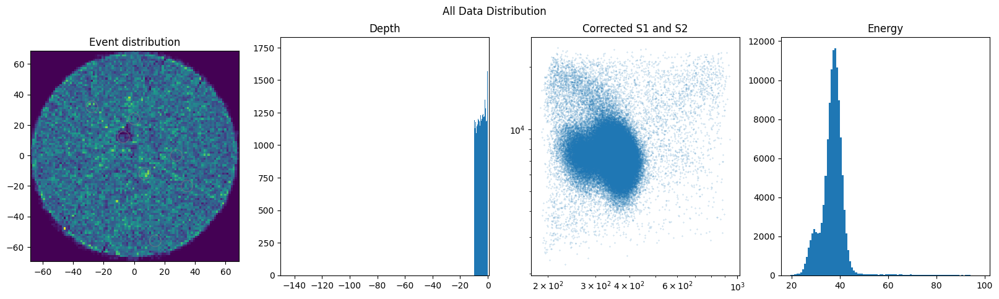

In [18]:
fig, ax = plt.subplots(1,4 , figsize= (20,5))
ax = ax.flatten()

ax[0].set_title('Event distribution')
_x, _y  = ei['x'], ei['y']
_bool_map = ~(np.isnan(_x) | np.isnan(_y))
heatmap_data, x_edges, y_edges = np.histogram2d(_x[_bool_map],_y[_bool_map], bins=100)
# Plot the heatmap using imshow
img = ax[0].imshow(heatmap_data.T, extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], origin='lower', cmap='viridis')
for i in dead_pmts:
        circle = plt.Circle((pmt_pos_top[i,-2], pmt_pos_top[i,-1]),  3  * 2.54 / 2, color='grey', alpha = 0.5, fill=False)
        ax[0].add_artist(circle)
#cbar = plt.colorbar(img, ax=ax[0], orientation='vertical')
ax[1].set_title('Depth')
ax[1].hist(ei['z'], bins = 100)
ax[1].set_xlim(-150, 1)
ax[2].set_title('Corrected S1 and S2')
ax[2].scatter(ei['cs1'], ei['cs2'], marker = '.',s=0.1)
ax[2].set_xscale('log')
ax[2].set_yscale('log')
ax[3].set_title('Energy')
ax[3].hist(ei['e_ces'], bins = 100) 
#ax[3].set_xlim(0, np.mean(ei['e_ces'])+5*np.std(ei['e_ces']))
fig.suptitle("All Data Distribution")

plt.show()

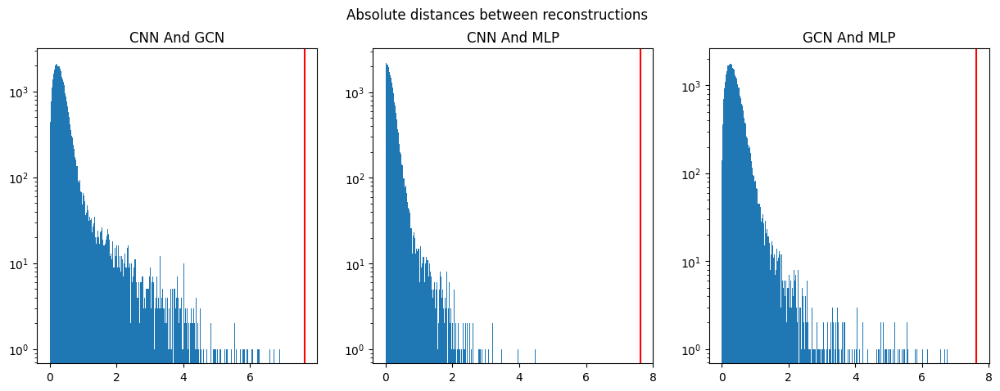

In [19]:
# Check distances between position predictions
fig, ax = plt.subplots(1,3, figsize=(15,5))
ax = ax.flatten()
bins = 1000
# TODO Replot after all filters except for agreeance, makes it much clearer
ax[0].set_title("CNN And GCN")
ax[0].hist(((ei["s2_x_cnn"] - ei["s2_x_gcn"])**2 + (ei["s2_y_cnn"] - ei["s2_y_gcn"])**2)**(1/2), bins=bins )
ax[0].axvline(2*straxen.tpc_pmt_radius,c='r')

ax[1].set_title("CNN And MLP")
ax[1].hist(((ei["s2_x_cnn"] - ei["s2_x_mlp"])**2 + (ei["s2_y_mlp"] - ei["s2_y_mlp"])**2)**(1/2), bins=bins )
ax[1].axvline(2*straxen.tpc_pmt_radius,c='r')

ax[2].set_title("GCN And MLP")
ax[2].hist(((ei["s2_x_gcn"] - ei["s2_x_mlp"])**2 + (ei["s2_y_gcn"] - ei["s2_y_mlp"])**2)**(1/2), bins=bins )
ax[2].axvline(2*straxen.tpc_pmt_radius,c='r')

for i in ax: i.set_yscale('log')
fig.suptitle("Absolute distances between reconstructions")
fig.show()


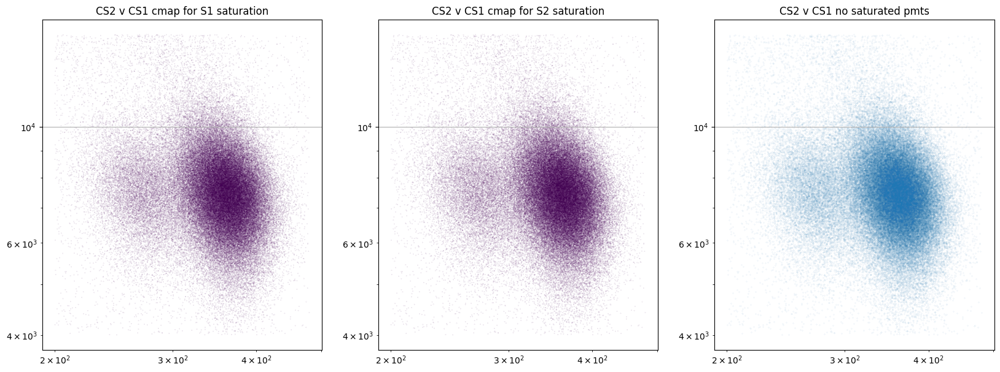

In [ ]:
# Saturated PMTs
fig, ax = plt.subplots(1,3, figsize = (20,7))
ax = ax.flatten()

ax[0].grid()
ax[0].scatter(ei["cs1"], ei["cs2"], c=ei["s1_n_saturated_channels"], marker = ".", s=0.01)
ax[0].set_title("CS2 v CS1 cmap for S1 saturation")
ax[0].set_xscale('log')
ax[0].set_yscale('log')

ax[1].grid()
ax[1].scatter(ei["cs1"], ei["cs2"], c=ei["s2_n_saturated_channels"], marker = ".", s=0.01)
ax[1].set_title("CS2 v CS1 cmap for S2 saturation")
ax[1].set_xscale('log')
ax[1].set_yscale('log')

ax[2].grid()
ax[2].scatter(ei["cs1"][ei["s1_n_saturated_channels"]+ei["s2_n_saturated_channels"] ==0], ei["cs2"][ei["s1_n_saturated_channels"]+ei["s2_n_saturated_channels"] ==0], marker = ".", s=0.01)
ax[2].set_title("CS2 v CS1 no saturated pmts")
ax[2].set_xscale('log')
ax[2].set_yscale('log')

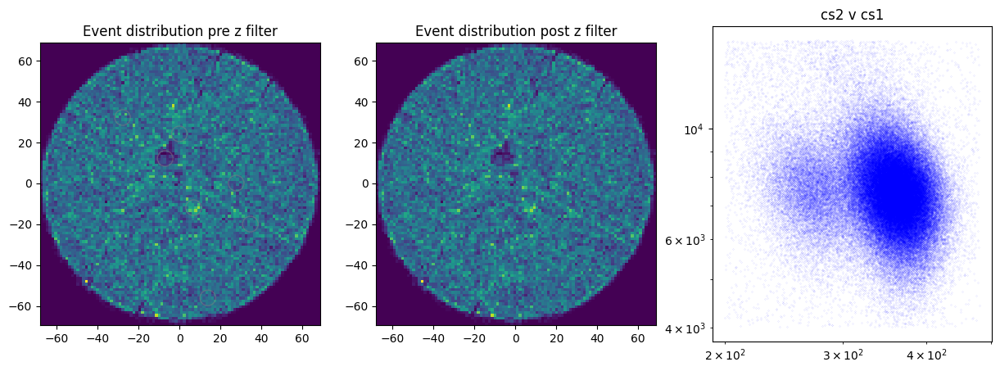

In [ ]:
fig, ax = plt.subplots(1,3 , figsize= (15,5))
ax = ax.flatten()

ax[0].set_title('Event distribution pre z filter')
_x, _y  = ei['x'], ei['y']
_bool_map = ~(np.isnan(_x) | np.isnan(_y))
heatmap_data, x_edges, y_edges = np.histogram2d(_x[_bool_map],_y[_bool_map], bins=100)
# Plot the heatmap using imshow
img = ax[0].imshow(heatmap_data.T, extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], origin='lower', cmap='viridis')
for i in dead_pmts:
        circle = plt.Circle((pmt_pos_top[i,-2], pmt_pos_top[i,-1]),  3  * 2.54 / 2, color='grey', alpha = 0.5, fill=False)
        ax[0].add_artist(circle)
_bool_map &= (ei["z"] >= -10)
heatmap_data, x_edges, y_edges = np.histogram2d(_x[_bool_map],_y[_bool_map], bins=100)
ax[1].set_title('Event distribution post z filter')
img = ax[1].imshow(heatmap_data.T, extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], origin='lower', cmap='viridis')

ax[2].set_title('cs2 v cs1')
ax[2].scatter(ei["cs1"][_bool_map], ei["cs2"][_bool_map],label='remains',c='b',marker = ".", s=0.01)
ax[2].scatter(ei["cs1"][~_bool_map], ei["cs2"][~_bool_map],label='removed',c='r',marker = ".", s=0.01)
ax[2].set_xscale('log')
ax[2].set_yscale('log')


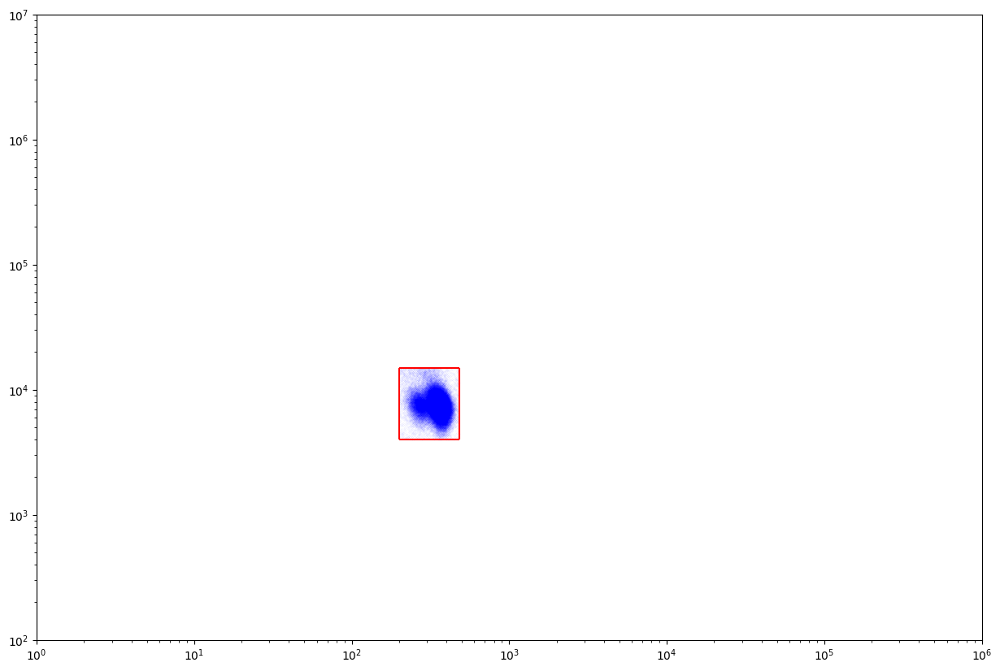

In [ ]:
# Energy Filter
# FIXME: Check Slack for the proper method 
fig = plt.figure(figsize=(15,10))
plt.scatter(ei["cs1"], ei["cs2"],label='remains',c='b',marker = ".", s=0.001)
plt.xlim(1e0, 1e6)
plt.ylim(1e2, 1e7)
plt.xscale('log')
plt.yscale('log')
y_corner = [2500, 18000]
x_corner = [160, 700]
plt.vlines(x_corner, *y_corner, color='r')
plt.hlines(y_corner, *x_corner, color='r')

## FFT

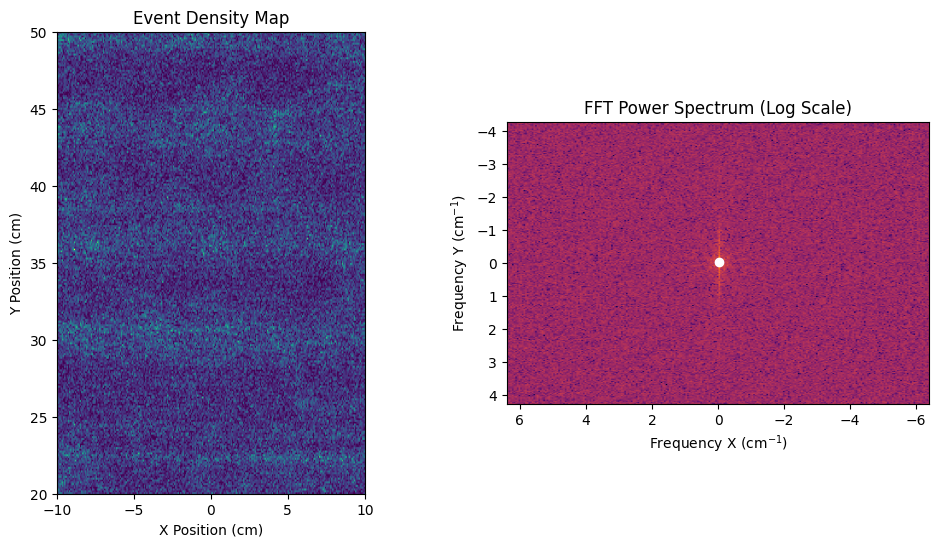

Maximum magnitude frequency coordinates: (-0.025, -0.017) cm^-1


In [11]:
import numpy as np
import os, h5py
import matplotlib.pyplot as plt
from scipy.fftpack import fft2, fftshift
from scipy.ndimage import gaussian_filter

# Function to scope only as we try using all data here
def make_fft_plot():
    # Get data from the HDF5 files
    def get_hdf5(path):
        with h5py.File(path, 'r') as f:
            pat = f['event_area_per_channel'][:]
            ei = f['event_info'][:]
        assert len(pat) == len(ei)
        return pat, ei

    hdf5_path = '/Code/processed_data/'
    dataset = {}
    run_ids = []
    for i in os.listdir(hdf5_path):
        if '0' == i[0]:
            try:
                pat,ei = get_hdf5(os.path.join(hdf5_path, i))
                run_ids.append(i.split('.')[0])
                dataset[i.split('.')[0]] = [pat, ei]
            except Exception as e:
                print(i)
                print(e)
    ei = np.concatenate([dataset[i][1] for i in dataset.keys()])
    x = ei['s2_x_mlp']
    y = ei['s2_y_mlp']

    # Step 1: Rotate coordinates by 30 degrees
    angle = np.radians(30)  # Convert angle to radians
    rotation_matrix = np.array([[np.cos(angle), -np.sin(angle)], [np.sin(angle), np.cos(angle)]])
    rotated_positions = np.dot(rotation_matrix, np.vstack((x, y)))  # Apply rotation

    # Extract rotated x and y coordinates
    rotated_x, rotated_y = rotated_positions[0], rotated_positions[1]

    x_range = [-10, 10]
    y_range = [20, 50]
    grid_size = 512 // 2

    x_spatial_extent = x_range[0] - x_range[1]  
    y_spatial_extent = y_range[0] - y_range[1]  
    x_bin_size = x_spatial_extent / grid_size
    y_bin_size = y_spatial_extent / grid_size
    density, xedges, yedges = np.histogram2d(rotated_x, rotated_y, bins=grid_size, range=[x_range, y_range])

    sigma = 1  # Adjust sigma for the level of smoothing (larger values = more smoothing)
    #density = gaussian_filter(density, sigma=sigma)

    # Step 3: Perform 2D FFT on the rotated density map
    fft_result = fft2(density.T)
    fft_result = fftshift(fft_result)  # Shift zero frequency to the center for visualization

    # Step 4: Calculate magnitude (power spectrum) and log scale for better visualization
    magnitude = np.abs(fft_result)
    log_magnitude = np.log1p(magnitude)

    # Step 5: Convert FFT plot extent to cm^-1
    f_max_x = 1 / (2 * x_bin_size)  # Max frequency in cm^-1 for x
    f_max_y = 1 / (2 * y_bin_size)  # Max frequency in cm^-1 for y
    freq_extent_x = np.linspace(-f_max_x, f_max_x, grid_size)
    freq_extent_y = np.linspace(-f_max_y, f_max_y, grid_size)

    # Step 6: Identify maximum magnitude location in frequency domain
    max_idx = np.unravel_index(np.argmax(magnitude), magnitude.shape)
    max_freq_x, max_freq_y = freq_extent_x[max_idx[1]], freq_extent_y[max_idx[0]]

    # Plotting the density map and its FFT power spectrum
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))

    # Original Density Map
    axs[0].imshow(density.T, origin='lower', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]], cmap='viridis')
    axs[0].set_title("Event Density Map")
    axs[0].set_xlabel("X Position (cm)")
    axs[0].set_ylabel("Y Position (cm)")

    # FFT Power Spectrum (log scale) with cm^-1 units
    axs[1].imshow(log_magnitude, extent=[-f_max_x, f_max_x, -f_max_y, f_max_y], origin='lower', cmap='inferno')
    axs[1].set_title("FFT Power Spectrum (Log Scale)")
    axs[1].set_xlabel("Frequency X (cm$^{-1}$)")
    axs[1].set_ylabel("Frequency Y (cm$^{-1}$)")

    # Annotate the maximum frequency location
    axs[1].plot(max_freq_x, max_freq_y, 'wo')  # Mark the maximum frequency point
    #axs[1].annotate(f'Max Frequency:\n({max_freq_x:.3f}, {max_freq_y:.3f}) cm$^{{-1}}$', 
    #                xy=(max_freq_x, max_freq_y), xytext=(max_freq_x + f_max_x/5, max_freq_y),
    #                arrowprops=dict(facecolor='white', arrowstyle="->"), color="white")
    
    #axs[1].set_xlim(-0.3, 0.3)
    #axs[1].set_ylim(-0.3, 0.3)

    plt.show()

    # Output max frequency coordinates for reference
    print(f"Maximum magnitude frequency coordinates: ({max_freq_x:.3f}, {max_freq_y:.3f}) cm^-1")
make_fft_plot()

# Filtering All of the Data

Note that this takes very long, there is approximately 8 million data points 

For each point I compute the flow model based position, the radial LCE (base) loss value

and the Neural Net loss value. Lastly I compute a number of filters  

All of this is then saved to two files, one only including the filtered data, 

one including all of the data 


Data is sourced from Krypton, AmBe, Background, Thorium and Radon runs 



Runids (python list of strings):

['058301', '059451', '059449', '059432', '058302', '059425', '058340', '058335', '059448', '059434', '058360', '058364', '059427', '059452', '058346', '059430', '059442', '058306', '059433', '059431', '059435', '058345', '059450', '058338', '058361', '059423', '059444', '058363', '058362', '059453', '059436', '058341', '058304', '059424', '058305', '059422', '059393', '068869', '059398', '059361', '059362', '059364', '068679', '059421', '068243', '059404', '068915', '059363', '068758', '068263', '059396', '059394', '059406', '068289', '059359', '059415', '059419', '068375', '059407', '059410', '068355', '068400', '068845', '059395', '068191', '068147', '068335', '059409', '068825', '059411', '059399', '068893', '059392', '059405', '068211', '059420', '068659', '059360', '068704', '059417', '059403', '068805', '059408', '059397', '060390', '060391', '060387', '060392', '060388', '060389', '060886', '060876', '060870', '060880', '060867', '060887', '060882', '060874', '060865', '060877', '060871', '060881', '060869', '060879', '060883', '060875', '060884', '060873', '060885', '060872', '065081', '065076', '065167', '057720', '057727', '065155', '065089', '065090', '057704', '057705', '065177', '057722', '065066', '065194', '064753', '065100', '065120', '064762', '064728', '065204', '065099', '065024', '065121', '065119', '065062', '064763', '065107', '065114', '065143', '065036', '065153', '065086', '065116', '065207', '064663', '065165', '064743', '064748', '065057', '064747', '065104', '065111', '064739', '065052', '065080', '064742', '065035', '065202', '065061', '065050', '065199', '065185', '065067', '065101', '065065', '064667', '057726', '057718', '065162', '064766', '065184', '064723', '065170', '057708', '065189', '065110', '065051', '065150', '065084', '065179', '065056', '064669', '065079', '057719', '064737', '064758', '057712', '065187', '064738', '057725', '065182', '065148', '065096', '064757', '057721', '065180', '065201', '065175', '065060', '064673', '065157', '065152', '065019', '065115', '065031', '064761', '065085', '065197', '064672', '064771', '065206', '064756', '065032', '064705', '065055', '065164', '064734', '065095', '065169', '065030', '065172', '064668', '065160', '065075', '064664', '065074', '057706', '057717', '065192', '065196', '064768', '065209', '065174', '065070', '065091', '064745', '065094', '065105', '057707', '065211', '065191', '064767', '065071', '065159']


The entire chain takes somewhere around an hour on my Home PC to run and an hour to compress and save, it also uses a lot of RAM, avoid running at all cost

In [ ]:
import straxen

In [ ]:
# imports
import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import tensorflow
import scipy
import keras
from IPython.display import clear_output
from functools import partial
import h5py

os.getcwd()

In [11]:
# None of these are filtered 

pmt_pos = straxen.pmt_positions()
pmt_pos_top = pmt_pos[pmt_pos.array == "top"].to_numpy()
n_pmts = pmt_pos_top.shape[0]

def get_dataa(path):
    with h5py.File(path, 'r') as f:
        patterns = f['event_area_per_channel'][:]
        ei = f['event_info'][:]
    assert len(patterns) == len(ei)
    return patterns, ei
# AmBe
all_patterns = []
all_ei = []
tmp_path = '/Code/processed_data/AmBe/'
for i in os.listdir(tmp_path):
    if '.hdf5' in i: 
        patterns, ei = get_dataa(os.path.join(tmp_path, i))
        all_patterns.append(patterns)
        all_ei.append(ei)

ambe_patterns = np.concatenate(all_patterns)
ambe_ei = np.concatenate(all_ei)

#Radon
all_patterns = []
all_ei = []
tmp_path = '/Code/processed_data/Radon/'
for i in os.listdir(tmp_path):
    if '.hdf5' in i: 
        patterns, ei = get_dataa(os.path.join(tmp_path, i))
        all_patterns.append(np.array(patterns))
        all_ei.append(ei)

rn_patterns = np.concatenate(all_patterns)
rn_ei = np.concatenate(all_ei)

#Background
all_patterns = []
all_ei = []
tmp_path = '/Code/processed_data/Background/'
for i in os.listdir(tmp_path):
    if '.hdf5' in i: 
        patterns, ei = get_dataa(os.path.join(tmp_path, i))
        all_patterns.append(np.array(patterns))
        all_ei.append(ei)

background_patterns = np.concatenate(all_patterns)
background_ei = np.concatenate(all_ei)


#Thorium 
all_patterns = []
all_ei = []
tmp_path = '/Code/processed_data/Thorium/'
for i in os.listdir(tmp_path):
    if '.hdf5' in i: 
        patterns, ei = get_dataa(os.path.join(tmp_path, i))
        all_patterns.append(np.array(patterns))
        all_ei.append(ei)

thorium_patterns = np.concatenate(all_patterns)
thorium_ei = np.concatenate(all_ei)

del all_patterns, all_ei 

In [12]:
# Krypton
all_patterns = []
all_ei = []
tmp_path = '/Code/processed_data/Krypton/'
for i in os.listdir(tmp_path):
    if '.hdf5' in i: 
        patterns, ei = get_dataa(os.path.join(tmp_path, i))
        all_patterns.append(np.array(patterns))
        all_ei.append(ei)

patterns = np.concatenate(all_patterns)
ei = np.concatenate(all_ei)
kr_cut = np.load('/Code/processed_data/Krypton/cut_Kr_SingleS1S2.npz')['data']

del all_patterns, all_ei 

In [13]:
dead_pmts = np.argwhere(patterns['s2_area_per_channel'][:,:len(pmt_pos_top)].mean(axis=0) == 0).reshape(-1)
not_dead_pmts = np.argwhere(patterns['s2_area_per_channel'][:,:len(pmt_pos_top)].mean(axis=0) != 0).reshape(-1)

In [14]:
# Load rLCE
from tensorflow import keras
import tensorflow as tf
class FilterAlive(keras.layers.Layer):
    def __init__(self, alive_pmt_indices, **kwargs):
        super().__init__(**kwargs)
        self.alive = alive_pmt_indices
    
    def call(self, X):
        return tf.gather(X, self.alive, axis = -1)
    
    def compute_output_shape(self, input_shape):
        return (input_shape[0], self.alive.shape)
    
# Taken from Shenyang and slightly modified
import math
class Likelihood(tf.keras.layers.Layer):
    def __init__(self, n_pmts, **kwargs):
        super().__init__(**kwargs)
        self.n_pmts = n_pmts

    def build(self, input_shape):
        self.sigma = self.add_weight(
            shape=(self.n_pmts, ), dtype=tf.float32, name='sigma',
            initializer=tf.keras.initializers.Ones(),
            trainable=True)
        self.power = self.add_weight(
            shape=(self.n_pmts, ), dtype=tf.float32, name='power',
            initializer=tf.keras.initializers.Ones(),
            trainable=True)
        super().build(input_shape)

    def call(self, inputs):
        
        cex, cob = inputs[0], inputs[1]
        c = tf.reduce_sum(cob, axis=-1)
        c = tf.reshape(c, (-1, 1))
        cex = cex * c # aex/aob is [events*pmtsize tensor]
        broaden = 1.2
        cons= 0.1
        y = - (
            ((cob * tf.math.log(cex) -tf.math.lgamma(cob + 1)) - 
                (cex * tf.math.log(cex) - tf.math.lgamma(cex + 1)) 
            )
        * cex / (broaden * cex + (0.1* self.sigma * cex**self.power) ** 2 + cons)
        - 0.5 * tf.math.log(2 * math.pi * ( broaden * cex + (0.1 * self.sigma * cex**self.power) **2 + cons)))
        
        chi2 = - 2 * (
            ((cob * tf.math.log(cex) -tf.math.lgamma(cob + 1)) - 
                (cex * tf.math.log(cex) - tf.math.lgamma(cex + 1)) 
            )
        * cex / (broaden * cex + (0.1* self.sigma * cex**self.power) ** 2 + cons)
        )
        return tf.reduce_sum(y, axis=1) / self.n_pmts, tf.reduce_sum(chi2, axis=1) / self.n_pmts#, 2*keras.backend.sum(cob*tensorflow.math.log(cob/cex) - (cob - cex), axis=1) / self.n_pmts

def _logl_loss(patterns, likelihood):
    return likelihood[0]
import sys
sys.path.append(os.path.join(os.getcwd(), 'ActualThesisWork'))
%load_ext autoreload
%autoreload 2
from functions import *

with tf.keras.utils.custom_object_scope({'_logl_loss': _logl_loss}):
    model = tf.keras.models.load_model("/Code/LCE_SR1/LCE_Neural_SR1")
model_chi2 = tf.keras.Model(
            model.inputs, model.get_layer("Likelihood").output
        )
loss_weights = model_chi2.get_layer('Likelihood').get_weights()

model_pattern = tf.keras.Model(model.inputs[0],
                                model.get_layer('normalization_1').output)


pmt_positions = pmt_pos_top[:,-2:]
i0s = np.array([4.3321685e-03, 4.8899297e-03, 4.8685744e-03, 5.0057671e-03, 5.0926125e-03, 3.8192207e-03, 5.0742184e-03, 4.5723971e-03, 4.4081882e-03, 4.2195930e-03, 3.8486260e-03, 4.1838391e-03, 4.0647872e-03, 4.7091218e-03, 5.0830012e-03, 3.3815645e-03, 4.4174474e-03, 4.2217500e-03, 3.8883914e-03, 4.1160719e-03, 4.2805159e-03, 3.8807073e-03, 4.0655909e-03, 4.1060778e-03, 4.1315975e-03, 4.7936141e-03, 3.2942444e-03, 4.9037142e-03, 7.7721901e-10, 3.8406078e-03, 4.3384172e-03, 4.0945616e-03, 4.1323849e-03, 3.5376074e-03, 4.1092960e-03, 4.0294765e-03, 4.2530410e-03, 4.3881517e-03, 4.3557761e-03, 5.2265157e-03, 4.7099791e-03, 4.0602549e-03, 3.7400448e-03, 3.7515005e-03, 4.2108428e-03, 3.9731641e-03, 3.8805525e-03, 4.0709740e-03, 4.3926593e-03, 3.8181171e-03, 4.2493315e-03, 4.1600037e-03, 4.4732001e-03, 5.6759203e-03, 5.1910682e-03, 4.2152693e-03, 3.8856652e-03, 3.9358442e-03, 3.9593815e-03, 4.5243143e-03, 3.3824742e-03, 4.2228648e-03, 4.1722674e-03, 4.0427274e-03, 4.0417486e-03, 3.9301920e-03, 3.6303743e-03, 4.8567164e-03, 4.6816585e-03, 4.6605649e-03, 4.1111340e-03, 3.9693397e-03, 3.9644395e-03, 3.6394752e-03, 4.1905139e-03, 3.8725468e-03, 4.0893927e-03, 4.0443619e-03, 3.8839907e-03, 4.1380730e-03, 3.7537001e-03, 3.9355555e-03, 3.7318014e-03, 3.8118435e-03, 5.2085049e-03, 4.2290958e-03, 4.0234900e-03, 3.5676390e-03, 3.9484301e-03, 4.2167031e-03, 4.2368169e-03, 4.1302987e-03, 4.2008958e-03, 4.2801257e-03, 4.1032447e-03, 4.4811480e-03, 4.2696339e-03, 3.6081157e-03, 4.0258458e-03, 3.9694263e-03, 4.5943419e-03, 4.1785482e-03, 4.4084764e-03, 3.7471219e-03, 4.4116797e-03, 4.0504644e-03, 4.1418886e-03, 4.0030433e-03, 1.0424008e-09, 4.2052269e-03, 4.2578629e-03, 4.5622797e-03, 4.0193330e-03, 4.1911956e-03, 4.2375987e-03, 4.2547933e-03, 3.5730435e-03, 4.5289211e-03, 4.9987421e-03, 4.0041506e-03, 3.9206431e-03, 8.3443069e-10, 4.0859459e-03, 4.0822630e-03, 4.1334494e-03, 4.3958416e-03, 4.0311846e-03, 4.0570530e-03, 4.8540146e-03, 4.1181887e-03, 4.2905537e-03, 3.9505828e-03, 4.1115014e-03, 4.2378809e-03, 5.4844008e-03, 5.1576579e-03, 4.2841639e-03, 4.0341225e-03, 3.7783773e-03, 4.0266900e-03, 4.2498759e-03, 4.2951452e-03, 4.3143658e-03, 4.1313837e-03, 2.1348676e-09, 4.1051428e-03, 4.2898878e-03, 4.2597717e-03, 3.8951659e-03, 4.0271045e-03, 4.2793071e-03, 4.0357350e-03, 3.9217505e-03, 3.9514182e-03, 4.1377540e-03, 3.9742026e-03, 1.2402929e-09, 3.9072270e-03, 4.0098960e-03, 4.4543701e-03, 4.4421032e-03, 4.2735850e-03, 4.3578045e-03, 3.8933735e-03, 6.5661332e-10, 4.0731006e-03, 4.1153133e-03, 3.7559553e-03, 5.4024002e-03, 4.3515279e-03, 3.6778662e-03, 4.5253038e-03, 4.1828337e-03, 4.0867706e-03, 4.4803121e-03, 4.2735278e-03, 4.0277829e-03, 3.0061767e-10, 4.3173237e-03, 3.6315513e-03, 3.7630824e-03, 3.9289133e-03, 3.7644394e-03, 4.8030056e-03, 4.8184181e-03, 3.8601037e-03, 4.0834383e-03, 3.8238778e-03, 3.9222855e-03, 4.1271560e-03, 4.2299703e-03, 4.2282301e-03, 4.2152260e-03, 4.2188424e-03, 4.2601079e-03, 4.1266191e-03, 3.9463951e-03, 4.1020829e-03, 5.2572191e-03, 5.6053256e-03, 4.0953509e-03, 4.2140838e-03, 4.0869401e-03, 4.3971362e-03, 3.9943284e-03, 3.9221593e-03, 4.0147733e-03, 3.9175176e-03, 4.2255772e-03, 3.2839905e-03, 3.5796922e-03, 4.3001343e-03, 5.2305199e-03, 5.2561881e-03, 4.1396990e-03, 3.9065215e-03, 4.0462790e-03, 4.4015646e-03, 3.9156144e-03, 4.1807001e-03, 3.7336536e-03, 2.8916472e-03, 4.3796739e-03, 3.7167547e-03, 3.8832054e-03, 4.9040765e-03, 4.0531182e-03, 4.4816649e-03, 4.2975284e-03, 4.2031519e-03, 3.7932515e-03, 3.6113819e-03, 4.0321909e-03, 4.0693702e-03, 3.8203422e-03, 4.2403601e-03, 4.1839005e-03, 4.4256304e-03, 4.6902383e-03, 4.6948199e-03, 4.1613793e-03, 4.3950700e-03, 4.9116057e-03, 4.2219968e-03, 4.4758134e-03, 4.3810243e-03, 5.3808806e-03, 4.1074217e-03, 4.7744270e-03, 5.3171408e-03, 5.0322791e-03, 4.8009814e-03, 4.0162178e-03])[not_dead_pmts]
rLCE_params = [1.6266745e+00,  9.4918861e+00, -4.2176653e-05,  7.7804564e-03,]

n_alive_pmts = n_pmts - len(dead_pmts)
# Model modified for Radial LCE
input_x = tf.keras.layers.Input(shape=(2,), name='xx', dtype=tf.float32)
x = tf.keras.layers.RepeatVector(n_alive_pmts, name='repeat_vector')(input_x)
rho = GetRadius((n_alive_pmts, 1), keras.backend.variable(pmt_positions[not_dead_pmts]), name='Event_Distance')(x)
#WallDist = GetWallDist((n_alive_pmts, 1),tpc_radius,name="WallDist")(x)
x = RadialLCELayer(guess=rLCE_params, n_groups=1, group_slices=np.arange(n_alive_pmts).reshape(1,-1),name='radial_LCE')((rho))
x = I0Layer(n_alive_pmts, name='i0')(x)
x = NormalizationLayer(name='normalization')(x)
# We pass the full array
input_y = tf.keras.layers.Input(shape=(n_pmts,), name='yy', dtype=tf.float32)
y_mod = FilterAlive(not_dead_pmts, name='aliveFilter')(input_y)
y, chi2 = Likelihood(n_alive_pmts, name='Likelihood')([x, y_mod])
radial_mc = tf.keras.models.Model(inputs=[input_x, input_y],
                                    outputs=[y, chi2], name='Radial_mc')

radial_mc.get_layer('i0').set_weights([i0s]) 
radial_mc.get_layer('i0').trainable = False
# No trainable Params but recongized as for some reason
radial_mc.get_layer('Event_Distance').trainable = False
#radial_mc.get_layer('WallDist').trainable = False
radial_mc.get_layer('radial_LCE').trainable = True
radial_mc.get_layer('Likelihood').trainable = False
radial_mc.get_layer('Likelihood').set_weights(loss_weights)

In [15]:
# Load Flow Model - Gives better positions (according to LCE's)

fname = '/Code/posrec_models_from_straxen/flow_20240730.tar.gz'
import tarfile 
def open_jax_model(model_path: str, **kwargs):
    # Copied directly from straxen including the two functions below (modified where required)
    # Nested import to reduce loading time of import straxen as it's not
    # a base requirement
    from jax import export

    # Check if the model file exists
    if not os.path.exists(model_path):
        raise FileNotFoundError(f"No file at {model_path}")
    # Extract required parameters from kwargs
    n_poly = kwargs["n_poly"]
    sig = kwargs["sig"]

    # Open the tar file and extract the requested model
    with tarfile.open(model_path, "r") as f:
        names = f.getnames()

        # Construct the filename based on n_poly and sig
        filename = f"{int(n_poly):02d}_{float(sig) * 1000:3.0f}"

        # Check if the requested model exists in the tar file
        if filename not in names:
            raise ValueError("Requested model not in tarfile!")

        # Extract and read the serialized JAX object
        file_obj = f.extractfile(filename)
        assert file_obj is not None
        serialized_jax_object = file_obj.read()
    # Deserialize the JAX object and return its callable function
    return export.deserialize(serialized_jax_object).call
def vectorized_prediction_chunk(patterns, pred_function, N_chunk_max):
    N_entries = patterns.shape[0]
    if N_entries > N_chunk_max:
        raise ValueError("Chunk greater than max size")
    else:
        inputs = np.zeros((N_chunk_max, pmt_pos_top.shape[0]+1))
        inputs[:N_entries] = patterns
        xy, contour = pred_function(inputs)
        return xy[:N_entries], contour[:N_entries]
def prediction_loop(patterns, pred_function, N_chunk_max=4096):
    N_entries = patterns.shape[0]
    # If the number of entries is within the chunk limit, process in one step
    if N_entries <= N_chunk_max:
        xy, _ = vectorized_prediction_chunk(patterns, pred_function, N_chunk_max)
        return [xy]  # Return as a single-element list for consistency
    N_chunks = N_entries // N_chunk_max
    xy_list = []
    # Process chunks
    for i in range(N_chunks):
        xy, _ = vectorized_prediction_chunk(
            patterns[i * N_chunk_max : (i + 1) * N_chunk_max], pred_function, N_chunk_max
        )
        xy_list.append(xy)

    # Process remaining entries, if any
    if N_chunks * N_chunk_max < N_entries:
        xy, _ = vectorized_prediction_chunk(
            patterns[N_chunks * N_chunk_max :], pred_function, N_chunk_max
        )
        xy_list.append(xy)
    return np.concatenate(xy_list, axis=0)

flow_model = open_jax_model(fname, n_poly=32, sig=0.393)
log_area_scale = 10


In [26]:
# Format Dataframe -> Append flow positions and compute Loss relative to those
import pandas as pd

# Make pandas arrays -> This is getting to annoying to work with the way I do
ambe_df = pd.DataFrame(ambe_ei)
ambe_df['s2_area_per_channel'] = list(ambe_patterns['s2_area_per_channel'][:, :n_pmts])
ambe_df['Source'] = 'AmBe'
# Prep data for flow 
with np.errstate(divide="ignore", invalid="ignore"):
    total_top_areas = ambe_patterns['s2_area_per_channel'][:, :n_pmts].sum(axis=1, keepdims=True)
    area_per_channel_top = ambe_patterns['s2_area_per_channel'][:, :n_pmts]
    flow_data = np.concatenate(
        [
            area_per_channel_top / total_top_areas,  # Normalize areas per channel
            np.log(total_top_areas) / log_area_scale,  # Log-scale transformation
        ],
        axis=1,
    )
ambe_df['position'] = list(prediction_loop(flow_data, flow_model))
ambe_df['rLCE_Loss'] = radial_mc.predict({'xx': np.array(ambe_df['position'].tolist()), 'yy': ambe_patterns['s2_area_per_channel'][:, :n_pmts]})[1]
ambe_df['NN_Loss'] = model_chi2.predict({'xx': np.array(ambe_df['position'].tolist()), 'yy': ambe_patterns['s2_area_per_channel'][:, :n_pmts]})[1]

del ambe_ei, ambe_patterns

rn_df = pd.DataFrame(rn_ei)
rn_df['s2_area_per_channel'] = list(rn_patterns['s2_area_per_channel'][:, :n_pmts])
rn_df['Source'] = 'Rn'
# Prep data for flow 
with np.errstate(divide="ignore", invalid="ignore"):
    total_top_areas = rn_patterns['s2_area_per_channel'][:, :n_pmts].sum(axis=1, keepdims=True)
    area_per_channel_top = rn_patterns['s2_area_per_channel'][:, :n_pmts]
    flow_data = np.concatenate(
        [
            area_per_channel_top / total_top_areas,  # Normalize areas per channel
            np.log(total_top_areas) / log_area_scale,  # Log-scale transformation
        ],
        axis=1,
    )
rn_df['position'] = list(prediction_loop(flow_data, flow_model))
rn_df['rLCE_Loss'] = radial_mc.predict({'xx': np.array(rn_df['position'].tolist()), 'yy': rn_patterns['s2_area_per_channel'][:, :n_pmts]})[1]
rn_df['NN_Loss'] = model_chi2.predict({'xx': np.array(rn_df['position'].tolist()), 'yy': rn_patterns['s2_area_per_channel'][:, :n_pmts]})[1]

del rn_ei, rn_patterns

background_df = pd.DataFrame(background_ei)
background_df['s2_area_per_channel'] = list(background_patterns['s2_area_per_channel'][:, :n_pmts])
background_df['Source'] = 'background'
# Prep data for flow 
with np.errstate(divide="ignore", invalid="ignore"):
    total_top_areas = background_patterns['s2_area_per_channel'][:, :n_pmts].sum(axis=1, keepdims=True)
    area_per_channel_top = background_patterns['s2_area_per_channel'][:, :n_pmts]
    flow_data = np.concatenate(
        [
            area_per_channel_top / total_top_areas,  # Normalize areas per channel
            np.log(total_top_areas) / log_area_scale,  # Log-scale transformation
        ],
        axis=1,
    )
background_df['position'] = list(prediction_loop(flow_data, flow_model))
background_df['rLCE_Loss'] = radial_mc.predict({'xx': np.array(background_df['position'].tolist()), 'yy': background_patterns['s2_area_per_channel'][:, :n_pmts]})[1]
background_df['NN_Loss'] = model_chi2.predict({'xx': np.array(background_df['position'].tolist()), 'yy': background_patterns['s2_area_per_channel'][:, :n_pmts]})[1]

del background_ei, background_patterns


th_df = pd.DataFrame(thorium_ei)
th_df['s2_area_per_channel'] = list(thorium_patterns['s2_area_per_channel'][:, :n_pmts])
th_df['Source'] = 'Th'
# Prep data for flow 
with np.errstate(divide="ignore", invalid="ignore"):
    total_top_areas = thorium_patterns['s2_area_per_channel'][:, :n_pmts].sum(axis=1, keepdims=True)
    area_per_channel_top = thorium_patterns['s2_area_per_channel'][:, :n_pmts]
    flow_data = np.concatenate(
        [
            area_per_channel_top / total_top_areas,  # Normalize areas per channel
            np.log(total_top_areas) / log_area_scale,  # Log-scale transformation
        ],
        axis=1,
    )
th_df['position'] = list(prediction_loop(flow_data, flow_model))
th_df['rLCE_Loss'] = radial_mc.predict({'xx': np.array(th_df['position'].tolist()), 'yy': thorium_patterns['s2_area_per_channel'][:, :n_pmts]})[1]
th_df['NN_Loss'] = model_chi2.predict({'xx': np.array(th_df['position'].tolist()), 'yy': thorium_patterns['s2_area_per_channel'][:, :n_pmts]})[1]

del thorium_patterns,thorium_ei 

20745/20745 [==============================] - 51s 2ms/step


In [27]:
# And lastly Krypton and concatenate
kr_df = pd.DataFrame(ei)
kr_df['s2_area_per_channel'] = list(patterns['s2_area_per_channel'][:, :n_pmts])
# Filter out act krypton events
kr_times = set(kr_cut['time'])
kr_df['Source'] = kr_df['time'].apply(lambda t: 'Kr' if t in kr_times else "Background")
# Prep data for flow 
with np.errstate(divide="ignore", invalid="ignore"):
    total_top_areas = patterns['s2_area_per_channel'][:, :n_pmts].sum(axis=1, keepdims=True)
    area_per_channel_top = patterns['s2_area_per_channel'][:, :n_pmts]
    flow_data = np.concatenate(
        [
            area_per_channel_top / total_top_areas,  # Normalize areas per channel
            np.log(total_top_areas) / log_area_scale,  # Log-scale transformation
        ],
        axis=1,
    )
kr_df['position'] = list(prediction_loop(flow_data, flow_model))
kr_df['rLCE_Loss'] = radial_mc.predict({'xx': np.array(kr_df['position'].tolist()) , 'yy': patterns['s2_area_per_channel'][:, :n_pmts]})[1]
kr_df['NN_Loss'] = model_chi2.predict({'xx': np.array(kr_df['position'].tolist()) , 'yy': patterns['s2_area_per_channel'][:, :n_pmts]})[1]

del patterns,ei 

all_data_df = pd.concat([ambe_df, rn_df, background_df, kr_df, th_df], ignore_index=True)

del ambe_df, rn_df, background_df, kr_df

94932/94932 [==============================] - 233s 2ms/step


In [28]:
# Nan Filter - will hold cuts as well
all_data_df['filter'] = ~all_data_df[['s2_x','s2_y']].isna().any(axis=1)

#### No Cuts

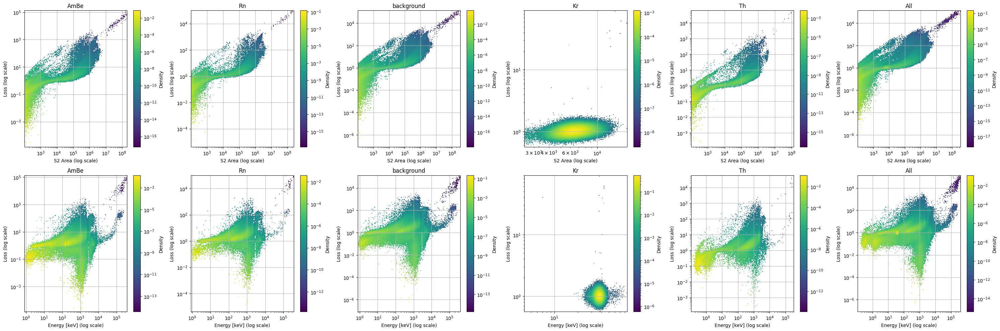

In [12]:
import matplotlib.pyplot as plt 
from matplotlib.colors import LogNorm
fig, ax = plt.subplots(2,6,figsize=(30,10)) 
bin_cnt = 200

for i, key in enumerate(('AmBe', 'Rn', 'background', 'Kr','Th', '')):  # Iterate over dataset keys
    # Extract filtered values
    tmp_bmap = ( all_data_df['filter']  &  1) # &1 makes a copy
    if key != '':
        tmp_bmap &=  (all_data_df['Source']==key) 
    s2_area = all_data_df['s2_area'][tmp_bmap]
    loss = all_data_df['rLCE_Loss'][tmp_bmap]
    
    # Define log-spaced bins for both axes
    x_bins = np.logspace(np.log10(np.nanmin(loss[loss > 0])), np.log10(np.nanmax(loss)), bin_cnt)
    y_bins = np.logspace(np.log10(np.nanmin(s2_area[s2_area > 0])), np.log10(np.nanmax(s2_area)), bin_cnt)
    
    # Create 2D histogram
    h = ax[0,i].hist2d(s2_area, loss, bins=[y_bins, x_bins], density=True, cmap='viridis', norm=LogNorm())
    
    # Set log scales for both axes
    ax[0,i].set_xscale('log')
    ax[0,i].set_yscale('log')
    key = key if key!='' else 'All'
    # Add titles and grid
    ax[0,i].set_title(key)
    ax[0,i].set_ylabel('Loss (log scale)')
    ax[0,i].set_xlabel('S2 Area (log scale)')
    ax[0,i].grid(True)#, which='both', linestyle='--', linewidth=0.5
    # Add colorbar for the histogram
    plt.colorbar(h[3], ax=ax[0,i], label='Density')

    #And Energy plot
    s2_area = all_data_df['e_ces'][tmp_bmap]
    y_bins = np.logspace(np.log10(np.nanmin(s2_area[s2_area > 0])), np.log10(np.nanmax(s2_area)), bin_cnt)
    
    # Create 2D histogram
    h = ax[1,i].hist2d(s2_area, loss, bins=[y_bins, x_bins], density=True, cmap='viridis', norm=LogNorm())
    
    # Set log scales for both axes
    ax[1,i].set_xscale('log')
    ax[1,i].set_yscale('log')
    key = key if key!='' else 'All'
    # Add titles and grid
    ax[1,i].set_title(key)
    ax[1,i].set_ylabel('Loss (log scale)')
    ax[1,i].set_xlabel('Energy [keV] (log scale)')
    ax[1,i].grid(True)#, which='both', linestyle='--', linewidth=0.5
    
    # Add colorbar for the histogram
    plt.colorbar(h[3], ax=ax[1,i], label='Density')

# Show the plot
plt.tight_layout()
plt.show()


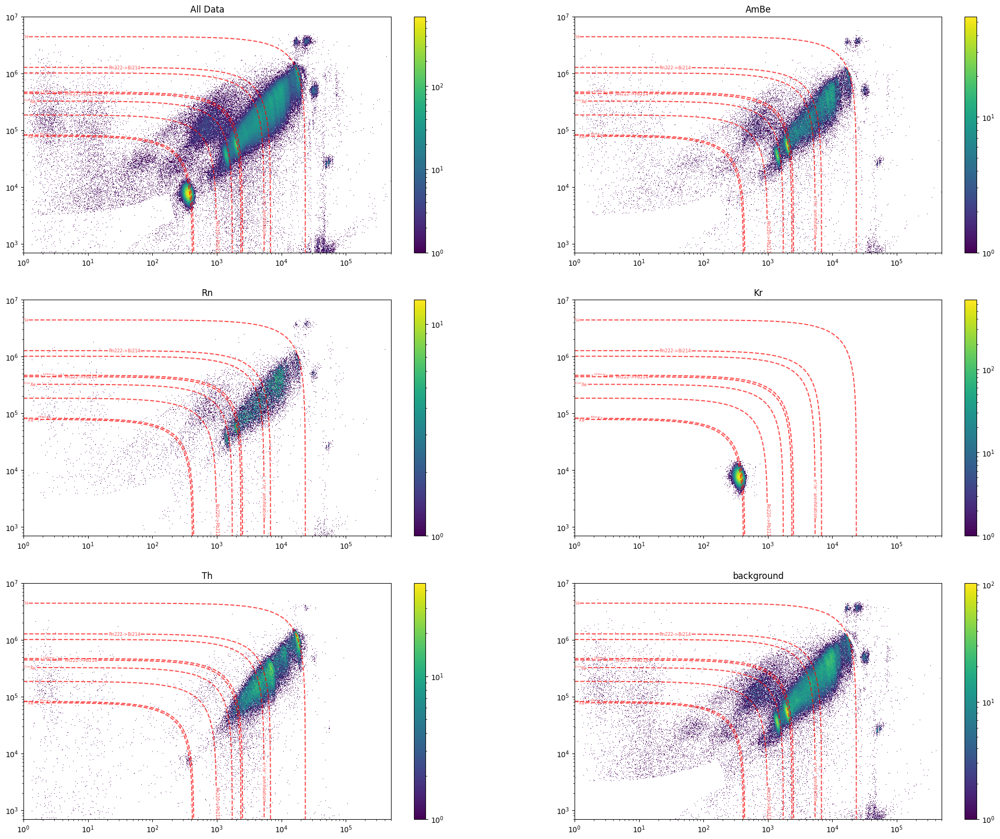

In [13]:
## CS1 CS2 Plot
from matplotlib.colors import LogNorm
fig = plt.figure(figsize=(25,20))
#2,3,
ax = []
ax.append(plt.subplot(3, 2, 1))
ax.append(plt.subplot(3, 2, 2))
ax.append(plt.subplot(3, 2, 3))
ax.append(plt.subplot(3, 2, 4))
ax.append(plt.subplot(3, 2, 5))
ax.append(plt.subplot(3, 2, 6))
# Constants 

bin_cnt = 200
# Taken from https://github.com/XENONnT/analysiscode/blob/master/g1g2_analysis/Full_cs1cs2_Plot/Full_Range_Plot.ipynb
AmBeIn_energy = 39.6
ar37_energy = 2.82
kr83m_energy = 41.5575
xe131m_energy = 163.930
xe129m_energy = 236.140
annih_energy = 510.999
bi214_energy = [609.320, 1764.491, 2204.059]  # To be completed when more stat.
co60_energy = [1173.228, 1332.492]
k40_energy = 1460.820
tl208_energy = 2614.511
h2_energy = 2224.52
c12_energy = 4400
# Isotope labels
AmBeIn_label = '$^{129}$Xe'
ar37_label = '$^{37}$Ar'
kr83m_label = '$^{83\mathregular{m}}$Kr'
xe131m_label = '$^{131\mathregular{m}}$Xe'
xe129m_label = '$^{129\mathregular{m}}$Xe'
annih_label = 'e$^{+}$/e$^{-}$ annihilation'
bi214_label = '$^{214}$Bi'
co60_label = '$^{60}$Co'
k40_label = '$^{40}$K'
tl208_label = '$^{208}$Tl'
h2_label = "$^{2}$H"
c12_label = "$^{12}$C"
def E_ces(cs1, cs2, g1, g2):
    w = 0.0137  # Is this value accurate enough?
    return w * (cs1 / g1 + cs2 / g2)

labels = {
    93.5: 'Rn220->Pb212',
    223: 'Rn222->Pb214',
    642: 'Rn222->Bi214',
    xe131m_energy: xe131m_label,
    xe129m_energy: xe129m_label,
    h2_energy: h2_label,
    annih_energy: annih_label,
    kr83m_energy: kr83m_label,
    AmBeIn_energy: AmBeIn_label, 
    }
levels =sorted(list(labels.keys()))

min_cs1 = 1e0
max_cs1 = 5e5
min_cs2 = 7e2
max_cs2 = 1e7
g1 = straxen.URLConfig(
        default="bodega://g1?bodega_version=v2",
        help="S1 gain in PE / photons produced",
    )
g1 =g1.eval("bodega://g1?bodega_version=v2")
g2 = straxen.URLConfig(
        default="bodega://g2?bodega_version=v2",
        help="S2 gain in PE / electrons produced",
    )
g2 = g2.eval("bodega://g2?bodega_version=v2")


#Generate CES lines
x = np.geomspace(min_cs1, max_cs1, 1000)
y = np.geomspace(min_cs2, max_cs2, 1000)  
xx, yy = np.meshgrid(x, y)
ces_grid = E_ces(xx, yy, g1, g2)

bins=2000
x_bins = np.logspace(np.log10(min_cs1), np.log10(max_cs1), bins)
y_bins = np.logspace(np.log10(min_cs2), np.log10(max_cs2), bins)
tmp_bmap = ( all_data_df['filter']  &  1)

##                  ALL DATA Plot
density, x_edges, y_edges = np.histogram2d(all_data_df['cs1'][tmp_bmap], all_data_df['cs2'][tmp_bmap], bins=[x_bins, y_bins])
mesh = ax[0].pcolormesh(x_edges, y_edges, density.T, cmap='viridis', norm=LogNorm())
cbar = plt.colorbar(mesh, ax=ax[0])
ax[0].set_xlim(min_cs1, max_cs1)
ax[0].set_ylim(min_cs2, max_cs2)
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_title('All Data')
CS = ax[0].contour(x, y, ces_grid, levels = levels,#[10, 100, 500, 1000, 2000, 3000],
            colors="r",alpha=0.7, linestyles = "dashed", 
            )
ax[0].clabel(CS, #CS.levels,#['Rn220->Pb212','Rn222->Pb214', 'Rn222->Bi214'],
        inline=True,
        fmt=labels,
        fontsize=6,
        inline_spacing=1,
        )
ax[0].set_ylim(min_cs2,max_cs2)
ax[0].set_xlim(min_cs1,max_cs1)

##                  Partial Data Plot
for j, key in enumerate(('AmBe', 'Rn', 'Kr', 'Th','background')):
    i=j+1
    density, x_edges, y_edges = np.histogram2d(all_data_df['cs1'][ tmp_bmap & (all_data_df['Source']==key) ], all_data_df['cs2'][ tmp_bmap & (all_data_df['Source']==key)], bins=[x_bins, y_bins])
    mesh = ax[i].pcolormesh(x_edges, y_edges, density.T, cmap='viridis', norm=LogNorm())
    cbar = plt.colorbar(mesh, ax=ax[i])
    ax[i].set_xlim(min_cs1, max_cs1)
    ax[i].set_ylim(min_cs2, max_cs2)
    ax[i].set_xscale('log')
    ax[i].set_yscale('log')
    ax[i].set_title(key)
    CS = ax[i].contour(x, y, ces_grid, levels = levels,#[10, 100, 500, 1000, 2000, 3000],
                colors="r",alpha=0.7, linestyles = "dashed", 
                )
    ax[i].clabel(CS, #CS.levels,#['Rn220->Pb212','Rn222->Pb214', 'Rn222->Bi214'],
            inline=True,
            fmt=labels,
            fontsize=6,
            inline_spacing=1,
            )

plt.show()

Text(0.5, 1.0, 'NN Loss')

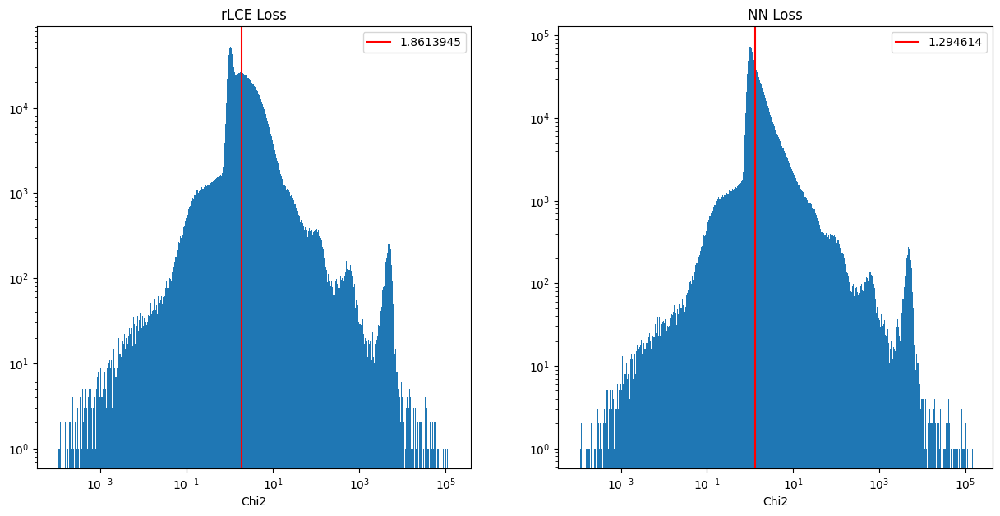

In [15]:
fig, ax = plt.subplots(1,2,figsize=(15,7))
x_bins = np.logspace(-4, np.log10(np.nanmax(all_data_df['rLCE_Loss'])), bins)
ax[0].hist(all_data_df['rLCE_Loss'], bins=x_bins)
ax[0].set_xscale('log')
ax[0].set_yscale('log')
median = np.sort(all_data_df['rLCE_Loss'])[len(all_data_df['rLCE_Loss'])//2]
ax[0].axvline(median, c='r', label=str(median))
ax[0].legend()
ax[0].set_xlabel('Chi2')
ax[0].set_title('rLCE Loss')

x_bins = np.logspace(-4, np.log10(np.nanmax(all_data_df['NN_Loss'])), bins)
ax[1].hist(all_data_df['NN_Loss'], bins=x_bins)
ax[1].set_xscale('log')
ax[1].set_yscale('log')
median = np.sort(all_data_df['NN_Loss'])[len(all_data_df['NN_Loss'])//2]
ax[1].axvline(median, c='r', label=str(median))
ax[1].legend()
ax[1].set_xlabel('Chi2')
ax[1].set_title('NN Loss')

Text(0.5, 1.0, 'NN Loss')

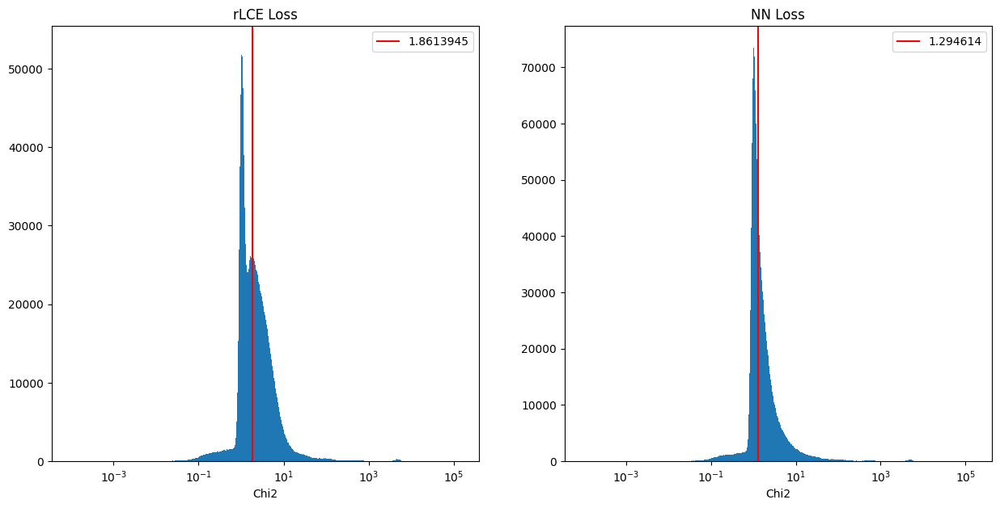

In [16]:
fig, ax = plt.subplots(1,2,figsize=(15,7))
x_bins = np.logspace(-4, np.log10(np.nanmax(all_data_df['rLCE_Loss'])), bins)
ax[0].hist(all_data_df['rLCE_Loss'], bins=x_bins)
ax[0].set_xscale('log')
median = np.sort(all_data_df['rLCE_Loss'])[len(all_data_df['rLCE_Loss'])//2]
ax[0].axvline(median, c='r', label=str(median))
ax[0].legend()
ax[0].set_xlabel('Chi2')
ax[0].set_title('rLCE Loss')

x_bins = np.logspace(-4, np.log10(np.nanmax(all_data_df['NN_Loss'])), bins)
ax[1].hist(all_data_df['NN_Loss'], bins=x_bins)
ax[1].set_xscale('log')
median = np.sort(all_data_df['NN_Loss'])[len(all_data_df['NN_Loss'])//2]
ax[1].axvline(median, c='r', label=str(median))
ax[1].legend()
ax[1].set_xlabel('Chi2')
ax[1].set_title('NN Loss')

/tmp/ipykernel_296/416993748.py:13: RuntimeWarning: divide by zero encountered in log10
  img = ax[i].imshow(np.log10(heatmap_data).T, extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], origin='lower', cmap='viridis')


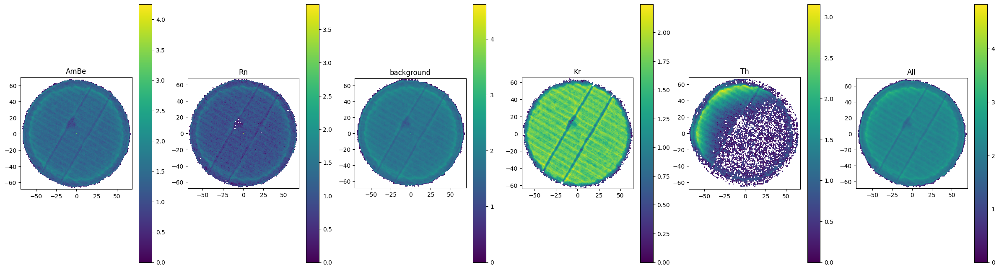

In [18]:
fig, ax = plt.subplots(1,6,figsize=(30,8))



for i, key in enumerate(('AmBe', 'Rn', 'background', 'Kr', 'Th','All')):  # Iterate over dataset keys
    # Extract filtered values
    tmp_bmap = ( all_data_df['filter']  &  1) # &1 makes a copy
    if key != 'All':
        tmp_bmap &=  (all_data_df['Source']==key)
    
    _x, _y  = all_data_df['s2_x'][tmp_bmap], all_data_df['s2_y'][tmp_bmap]
    heatmap_data, x_edges, y_edges = np.histogram2d(_x,_y, bins=200)
    img = ax[i].imshow(np.log10(heatmap_data).T, extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], origin='lower', cmap='viridis')
    cbar = plt.colorbar(img, ax=ax[i])
    ax[i].set_title(key)


### Apply Cuts - > Copied them out of straxen as I didnt want to go back and rerun all of this

Quality / Validity Cuts Modify single_scatters column:

- Single Scatter Cut 
- Interaction Exists & Main Peak Must Trigger -> Enforce s1 before s2 & main s1 or s2 considered a triggering peak  

Band Cuts - New column band

- NRBandSelection - Within NR band but not classification just in the right ratio


Interaction Type Cuts - Modify Source Column:

- Ar37 -> None Should be Present
- Kr Selection -> TODO



In [ ]:
# In case i mess something up
all_data_df['filter'] = ~all_data_df[['s2_x','s2_y']].isna().any(axis=1)

In [29]:
# Single Scatter

CONFIG_SR1 = {
    "min_allowed_alt_s2_area_offset_low_s2": 200,
    "min_allowed_alt_s2_area_slope_low_s2": 0.0143,
    "min_allowed_alt_s2_area_offset_high_s2": 210,
    "min_allowed_alt_s2_area_slope_high_s2": 0.02,
    "boundary_low_and_high_s2": 30000,
    "coeffcient_fermi_dirac": 5e-4,
}

def fermi_dirac_low_s2(s2_area, k, b, bound, coeff):
    return (k * s2_area + b) / (1 + np.exp(coeff * (s2_area - bound)))

def fermi_dirac_high_s2(s2_area, k, b, bound, coeff):
    return (k * s2_area + b) / (1 + np.exp(coeff * (bound - s2_area)))

def s2_single_scatter_cut(s2_area, config=CONFIG_SR1):
    max_allowed_alt_s2_area = fermi_dirac_low_s2(
        s2_area,
        config["min_allowed_alt_s2_area_slope_low_s2"],
        config["min_allowed_alt_s2_area_offset_low_s2"],
        config["boundary_low_and_high_s2"],
        config["coeffcient_fermi_dirac"],
    )
    max_allowed_alt_s2_area += fermi_dirac_high_s2(
        s2_area,
        config["min_allowed_alt_s2_area_slope_high_s2"],
        config["min_allowed_alt_s2_area_offset_high_s2"],
        config["boundary_low_and_high_s2"],
        config["coeffcient_fermi_dirac"],
    )
    return max_allowed_alt_s2_area

def cut_s2_single_scatter(events, config=CONFIG_SR1):
    s2_area = events["s2_area"]
    alt_s2_area = events["alt_s2_area"]
    max_allowed = s2_single_scatter_cut(s2_area, config)
    mask_alt_s2_small = alt_s2_area < max_allowed
    mask_alt_s2_not_exist = np.isnan(alt_s2_area)
    mask = mask_alt_s2_small | mask_alt_s2_not_exist
    return mask

all_data_df['single_scatters'] = cut_s2_single_scatter(all_data_df, config=CONFIG_SR1)#np.concatenate(full_bmap + [np.ones(patterns['s2_area_per_channel'][~(np.isnan(ei['s2_x']) | np.isnan(ei['s2_y']))].shape[0],dtype='bool')])
all_data_df['filter'] &= all_data_df['single_scatters']
print("Now {} from {} originally remaining".format(all_data_df['single_scatters'].sum(), all_data_df['filter'].sum()))

Now 5324215 from 5323947 originally remaining


/opt/XENONnT/anaconda/envs/XENONnT_el9.2024.10.4/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [30]:
## Interaction Exists

def InteractionExists(data):
    return (data['s1_time'] > 0) & (data['s2_time'] > 0)

def MainPeakMustTrigger(events, trigger_min_area=100, trigger_max_competing=0.25e6):
    """
    trigger_min_area : Default from https://github.com/XENONnT/straxen/blob/f765c102c15bf721b8e1709a13b6da2b23484f70/straxen/plugins/events/events.py#L51
    trigger_max_competing : Same as above
    """
    return ((events["s1_area"] > trigger_min_area) & (events["s1_n_competing"] <= trigger_max_competing)) | ((events["s2_area"] > trigger_min_area) & (events["s2_n_competing"] <= trigger_max_competing))

og =all_data_df['filter'].sum()
all_data_df['InteractionExists'] = InteractionExists(all_data_df)
all_data_df['filter'] &= all_data_df['InteractionExists']
print("Now {} from {} originally remaining".format(all_data_df['filter'].sum(), og))

og =all_data_df['filter'].sum()
all_data_df['MainPeakMustTrigger'] = MainPeakMustTrigger(all_data_df)
all_data_df['filter'] &= all_data_df['MainPeakMustTrigger']
print("Now {} from {} originally remaining".format(all_data_df['filter'].sum(), og))

Now 4458306 from 5323947 originally remaining
Now 4458306 from 4458306 originally remaining


In [31]:
# AFT Cut
def aft_quantile(s2, a, b, c):
    return a + b / np.sqrt(s2) + c * s2
def kwargs_for_np_select(cs2_wo_elifecorr, division, param_set, default=None):
    if default is None:
        default = aft_quantile(division[-1], *param_set[-1])
    return {
        "condlist": [cs2_wo_elifecorr < threshold for threshold in division],
        "choicelist": [aft_quantile(cs2_wo_elifecorr, *param) for param in param_set],
        "default": default,
    }
def cs2_aft_cut(cs2_wo_elifecorr, cs2_division_lower_limit=[2e4, 1e5, 1e6], cs2_aft_param_lower_limit=[[0.7645, -1.914, -1.52e-8], [0.7607, -1.3129, 2.45e-9], [0.75679, 0, 0]],cs2_division_upper_limit=[2e4, 1e5, 1e6], cs2_aft_param_upper_limit=[[0.7668, 1.7915, 5.76e-9], [0.7692, 1.1637, 1.02e-9], [0.77298, 0, 0]] ):
        kwargs = kwargs_for_np_select(
            cs2_wo_elifecorr,
            division=cs2_division_lower_limit,
            param_set=cs2_aft_param_lower_limit,
            default=0,
        )
        aft_lower_limit = np.select(**kwargs)

        kwargs = kwargs_for_np_select(
            cs2_wo_elifecorr,
            division=cs2_division_upper_limit,
            param_set=cs2_aft_param_upper_limit,
        )
        aft_upper_limit = np.select(**kwargs)

        return aft_lower_limit, aft_upper_limit
def cS2AreaFractionTop(events):
    """Values from SR1 Used"""
    aft_lower_limit, aft_upper_limit = cs2_aft_cut(events["cs2_wo_elifecorr"])
    return ((events["cs2_area_fraction_top"] > aft_lower_limit) &
            (events["cs2_area_fraction_top"] < aft_upper_limit))

og =all_data_df['filter'].sum()
all_data_df['S2_AFT_Cut'] = cS2AreaFractionTop(all_data_df)
all_data_df['filter'] &= all_data_df['S2_AFT_Cut'] 
print("Now {} from {} originally remaining".format(all_data_df['filter'].sum(), og))

Now 3321130 from 4458306 originally remaining


In [32]:
#Ar37

def Ar37_KShell_S1S2Area(events, ar37_kshell_s1_area=(0,67), ar37_kshell_s2_area=(540,6340)):
    return ((events["s1_area"] >= ar37_kshell_s1_area[0]) &
            (events["s1_area"] < ar37_kshell_s1_area[1]) &
            (events["s2_area"] >= ar37_kshell_s2_area[0]) &
            (events["s2_area"] < ar37_kshell_s2_area[1]))


def Ar37_LShell_S2Area(events, ar37_lshell_s2_area=(0, 540)):
    return ((events["s2_area"] >= ar37_lshell_s2_area[0]) &
            (events["s2_area"] < ar37_lshell_s2_area[1]))

ar37K = Ar37_KShell_S1S2Area(all_data_df)
ar37L = Ar37_LShell_S2Area(all_data_df)

print('{} Ar K Shell Events'.format(ar37K.sum()))
print('{} Ar L Shell Events'.format(ar37L.sum()))
print('{} Overlap'.format((ar37L & ar37K).sum())) # Sanity Check 

all_data_df.loc[ar37K,'Source'] = 'Ar37K'
all_data_df.loc[ar37L,'Source'] = 'Ar37L'

30205 Ar K Shell Events
424258 Ar L Shell Events
0 Overlap


In [33]:
# NR Band
def nr_band(x, A, B, C, D):
    return A * np.exp(-x / B) + C * x + D
def NRBandSelection(events, high_boundary_parameters= (0.717, 20.1, -0.00232, 1.75), low_boundary_parameters=(0.291, 33.0, -0.00176, 1.454), upper_cs1_boundary=200):
    log10_cs2_cs1 = np.log10(events["cs2"] / events["cs1"])
    return ((log10_cs2_cs1 >= nr_band(events["cs1"], *low_boundary_parameters)) &
            (log10_cs2_cs1 < nr_band(events["cs1"], *high_boundary_parameters)) &
            (events["cs1"] < upper_cs1_boundary) )

all_data_df['band'] = ''
nr =NRBandSelection(all_data_df)
all_data_df.loc[nr, 'band'] = 'NR'
print("{} Entries in NR band".format(nr.sum())) #Seems wrong but act nothing in that region

9461 Entries in NR band


/opt/XENONnT/anaconda/envs/XENONnT_el9.2024.10.4/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/opt/XENONnT/anaconda/envs/XENONnT_el9.2024.10.4/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [35]:
# Save all data
all_data_df.to_pickle('/Code/processed_data/all_data.pkl.gz', compression='gzip')

In [37]:
# Save filtered data 
print(f'{all_data_df.shape[0]} data points')
subset = all_data_df[all_data_df['filter']]
# Pop things i know i definitely wont use 
subset.to_pickle('/Code/processed_data/all_data_min_filter.pkl.gz', compression='gzip')
del subset

7990690 data points


In [ ]:
# Load the subset 
all_data_df = pd.read_pickle('/Code/processed_data/all_data_min_filter.pkl.gz', compression='gzip')

And replot everything

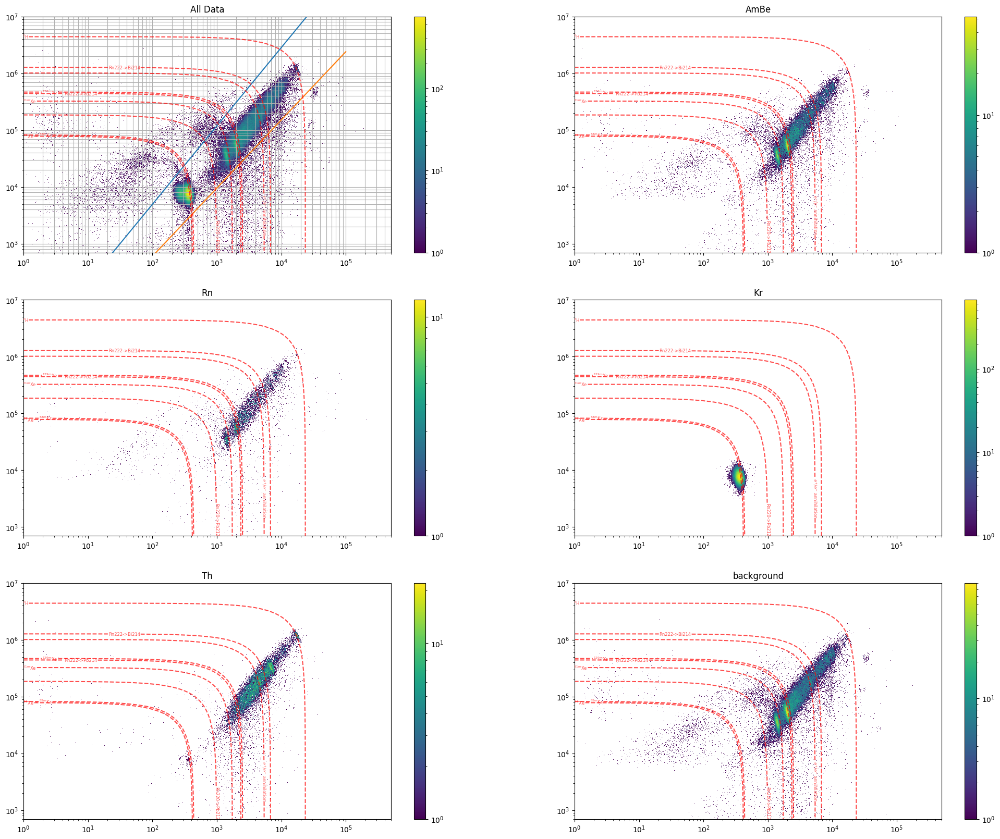

In [22]:
## CS1 CS2 Plot
from matplotlib.colors import LogNorm
fig = plt.figure(figsize=(25,20))
#2,3,
ax = []
ax.append(plt.subplot(3, 2, 1))
ax.append(plt.subplot(3, 2, 2))
ax.append(plt.subplot(3, 2, 3))
ax.append(plt.subplot(3, 2, 4))
ax.append(plt.subplot(3, 2, 5))
ax.append(plt.subplot(3, 2, 6))
# Constants 

bin_cnt = 200
# Taken from https://github.com/XENONnT/analysiscode/blob/master/g1g2_analysis/Full_cs1cs2_Plot/Full_Range_Plot.ipynb
AmBeIn_energy = 39.6
ar37_energy = 2.82
kr83m_energy = 41.5575
xe131m_energy = 163.930
xe129m_energy = 236.140
annih_energy = 510.999
bi214_energy = [609.320, 1764.491, 2204.059]  # To be completed when more stat.
co60_energy = [1173.228, 1332.492]
k40_energy = 1460.820
tl208_energy = 2614.511
h2_energy = 2224.52
c12_energy = 4400
# Isotope labels
AmBeIn_label = '$^{129}$Xe'
ar37_label = '$^{37}$Ar'
kr83m_label = '$^{83\mathregular{m}}$Kr'
xe131m_label = '$^{131\mathregular{m}}$Xe'
xe129m_label = '$^{129\mathregular{m}}$Xe'
annih_label = 'e$^{+}$/e$^{-}$ annihilation'
bi214_label = '$^{214}$Bi'
co60_label = '$^{60}$Co'
k40_label = '$^{40}$K'
tl208_label = '$^{208}$Tl'
h2_label = "$^{2}$H"
c12_label = "$^{12}$C"
def E_ces(cs1, cs2, g1, g2):
    w = 0.0137  # Is this value accurate enough?
    return w * (cs1 / g1 + cs2 / g2)

labels = {
    93.5: 'Rn220->Pb212',
    223: 'Rn222->Pb214',
    642: 'Rn222->Bi214',
    xe131m_energy: xe131m_label,
    xe129m_energy: xe129m_label,
    h2_energy: h2_label,
    annih_energy: annih_label,
    kr83m_energy: kr83m_label,
    AmBeIn_energy: AmBeIn_label, 
    }
levels =sorted(list(labels.keys()))

min_cs1 = 1e0
max_cs1 = 5e5
min_cs2 = 7e2
max_cs2 = 1e7
g1 = straxen.URLConfig(
        default="bodega://g1?bodega_version=v2",
        help="S1 gain in PE / photons produced",
    )
g1 =g1.eval("bodega://g1?bodega_version=v2")
g2 = straxen.URLConfig(
        default="bodega://g2?bodega_version=v2",
        help="S2 gain in PE / electrons produced",
    )
g2 = g2.eval("bodega://g2?bodega_version=v2")


#Generate CES lines
x = np.geomspace(min_cs1, max_cs1, 1000)
y = np.geomspace(min_cs2, max_cs2, 1000)  
xx, yy = np.meshgrid(x, y)
ces_grid = E_ces(xx, yy, g1, g2)

bins=2000
x_bins = np.logspace(np.log10(min_cs1), np.log10(max_cs1), bins)
y_bins = np.logspace(np.log10(min_cs2), np.log10(max_cs2), bins)
tmp_bmap = ( all_data_df['filter']  &  1)

##                  ALL DATA Plot
density, x_edges, y_edges = np.histogram2d(all_data_df['cs1'][tmp_bmap], all_data_df['cs2'][tmp_bmap], bins=[x_bins, y_bins])
mesh = ax[0].pcolormesh(x_edges, y_edges, density.T, cmap='viridis', norm=LogNorm())
cbar = plt.colorbar(mesh, ax=ax[0])
ax[0].set_xlim(min_cs1, max_cs1)
ax[0].set_ylim(min_cs2, max_cs2)
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_title('All Data')
ax[0].grid(which='both')

tst_x = np.logspace(0,5,2000)
tst_y = 8.6*tst_x**(1.38)
ax[0].plot(tst_x,tst_y)
tst_y = 2.4*tst_x**(1.20)
ax[0].plot(tst_x,tst_y)

CS = ax[0].contour(x, y, ces_grid, levels = levels,#[10, 100, 500, 1000, 2000, 3000],
            colors="r",alpha=0.7, linestyles = "dashed", 
            )
ax[0].clabel(CS, #CS.levels,#['Rn220->Pb212','Rn222->Pb214', 'Rn222->Bi214'],
        inline=True,
        fmt=labels,
        fontsize=6,
        inline_spacing=1,
        )
ax[0].set_ylim(min_cs2,max_cs2)
ax[0].set_xlim(min_cs1,max_cs1)

##                  Partial Data Plot
for j, key in enumerate(('AmBe', 'Rn', 'Kr','Th', 'background')):
    i=j+1
    density, x_edges, y_edges = np.histogram2d(all_data_df['cs1'][ tmp_bmap & (all_data_df['Source']==key) ], all_data_df['cs2'][ tmp_bmap & (all_data_df['Source']==key)], bins=[x_bins, y_bins])
    mesh = ax[i].pcolormesh(x_edges, y_edges, density.T, cmap='viridis', norm=LogNorm())
    cbar = plt.colorbar(mesh, ax=ax[i])
    ax[i].set_xlim(min_cs1, max_cs1)
    ax[i].set_ylim(min_cs2, max_cs2)
    ax[i].set_xscale('log')
    ax[i].set_yscale('log')
    ax[i].set_title(key)
    CS = ax[i].contour(x, y, ces_grid, levels = levels,#[10, 100, 500, 1000, 2000, 3000],
                colors="r",alpha=0.7, linestyles = "dashed", 
                )
    ax[i].clabel(CS, #CS.levels,#['Rn220->Pb212','Rn222->Pb214', 'Rn222->Bi214'],
            inline=True,
            fmt=labels,
            fontsize=6,
            inline_spacing=1,
            )

plt.show()

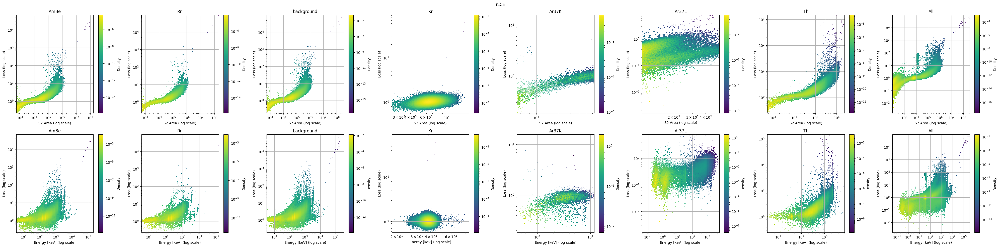

In [23]:
import matplotlib.pyplot as plt 
from matplotlib.colors import LogNorm
fig, ax = plt.subplots(2,8,figsize=(40,10)) 
bin_cnt = 200

for i, key in enumerate(('AmBe', 'Rn', 'background', 'Kr', 'Ar37K', 'Ar37L', 'Th', '')):  # Iterate over dataset keys
    # Extract filtered values
    tmp_bmap = ( all_data_df['filter'] & 1 ) # &1 makes a copy
    if key != '':
        tmp_bmap &=  (all_data_df['Source']==key) 
    s2_area = all_data_df['s2_area'][tmp_bmap]
    loss = all_data_df['rLCE_Loss'][tmp_bmap]
    
    # Define log-spaced bins for both axes
    x_bins = np.logspace(np.log10(np.nanmin(loss[loss > 0])), np.log10(np.nanmax(loss)), bin_cnt)
    y_bins = np.logspace(np.log10(np.nanmin(s2_area[s2_area > 0])), np.log10(np.nanmax(s2_area)), bin_cnt)
    
    # Create 2D histogram
    h = ax[0,i].hist2d(s2_area, loss, bins=[y_bins, x_bins], density=True, cmap='viridis', norm=LogNorm())
    
    # Set log scales for both axes
    ax[0,i].set_xscale('log')
    ax[0,i].set_yscale('log')
    key = key if key!='' else 'All'
    # Add titles and grid
    ax[0,i].set_title(key)
    ax[0,i].set_ylabel('Loss (log scale)')
    ax[0,i].set_xlabel('S2 Area (log scale)')
    ax[0,i].grid(True)#, which='both', linestyle='--', linewidth=0.5
    # Add colorbar for the histogram
    plt.colorbar(h[3], ax=ax[0,i], label='Density')

    #And Energy plot
    s2_area = all_data_df['e_ces'][tmp_bmap]
    y_bins = np.logspace(np.log10(np.nanmin(s2_area[s2_area > 0])), np.log10(np.nanmax(s2_area)), bin_cnt)
    
    # Create 2D histogram
    h = ax[1,i].hist2d(s2_area, loss, bins=[y_bins, x_bins], density=True, cmap='viridis', norm=LogNorm())
    
    # Set log scales for both axes
    ax[1,i].set_xscale('log')
    ax[1,i].set_yscale('log')
    key = key if key!='' else 'All'
    # Add titles and grid
    ax[1,i].set_title(key)
    ax[1,i].set_ylabel('Loss (log scale)')
    ax[1,i].set_xlabel('Energy [keV] (log scale)')
    ax[1,i].grid(True)#, which='both', linestyle='--', linewidth=0.5
    
    # Add colorbar for the histogram
    plt.colorbar(h[3], ax=ax[1,i], label='Density')
fig.suptitle('rLCE')
# Show the plot
plt.tight_layout()
plt.show()


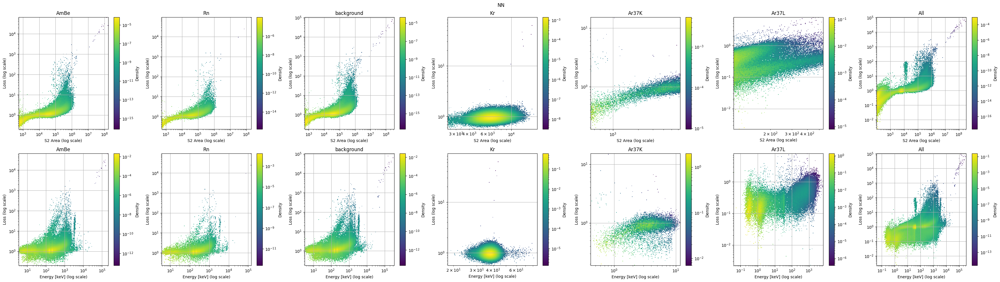

In [24]:
import matplotlib.pyplot as plt 
from matplotlib.colors import LogNorm
fig, ax = plt.subplots(2,7,figsize=(35,10)) 
bin_cnt = 200

for i, key in enumerate(('AmBe', 'Rn', 'background', 'Kr', 'Ar37K', 'Ar37L', '')):  # Iterate over dataset keys
    # Extract filtered values
    tmp_bmap = ( all_data_df['filter'] & 1 ) # &1 makes a copy
    if key != '':
        tmp_bmap &=  (all_data_df['Source']==key) 
    s2_area = all_data_df['s2_area'][tmp_bmap]
    loss = all_data_df['NN_Loss'][tmp_bmap]
    
    # Define log-spaced bins for both axes
    x_bins = np.logspace(np.log10(np.nanmin(loss[loss > 0])), np.log10(np.nanmax(loss)), bin_cnt)
    y_bins = np.logspace(np.log10(np.nanmin(s2_area[s2_area > 0])), np.log10(np.nanmax(s2_area)), bin_cnt)
    
    # Create 2D histogram
    h = ax[0,i].hist2d(s2_area, loss, bins=[y_bins, x_bins], density=True, cmap='viridis', norm=LogNorm())
    
    # Set log scales for both axes
    ax[0,i].set_xscale('log')
    ax[0,i].set_yscale('log')
    key = key if key!='' else 'All'
    # Add titles and grid
    ax[0,i].set_title(key)
    ax[0,i].set_ylabel('Loss (log scale)')
    ax[0,i].set_xlabel('S2 Area (log scale)')
    ax[0,i].grid(True)#, which='both', linestyle='--', linewidth=0.5
    # Add colorbar for the histogram
    plt.colorbar(h[3], ax=ax[0,i], label='Density')

    #And Energy plot
    s2_area = all_data_df['e_ces'][tmp_bmap]
    y_bins = np.logspace(np.log10(np.nanmin(s2_area[s2_area > 0])), np.log10(np.nanmax(s2_area)), bin_cnt)
    
    # Create 2D histogram
    h = ax[1,i].hist2d(s2_area, loss, bins=[y_bins, x_bins], density=True, cmap='viridis', norm=LogNorm())
    
    # Set log scales for both axes
    ax[1,i].set_xscale('log')
    ax[1,i].set_yscale('log')
    key = key if key!='' else 'All'
    # Add titles and grid
    ax[1,i].set_title(key)
    ax[1,i].set_ylabel('Loss (log scale)')
    ax[1,i].set_xlabel('Energy [keV] (log scale)')
    ax[1,i].grid(True)#, which='both', linestyle='--', linewidth=0.5
    
    # Add colorbar for the histogram
    plt.colorbar(h[3], ax=ax[1,i], label='Density')

fig.suptitle('NN')
# Show the plot
plt.tight_layout()
plt.show()


Text(0.5, 1.0, 'NN Loss')

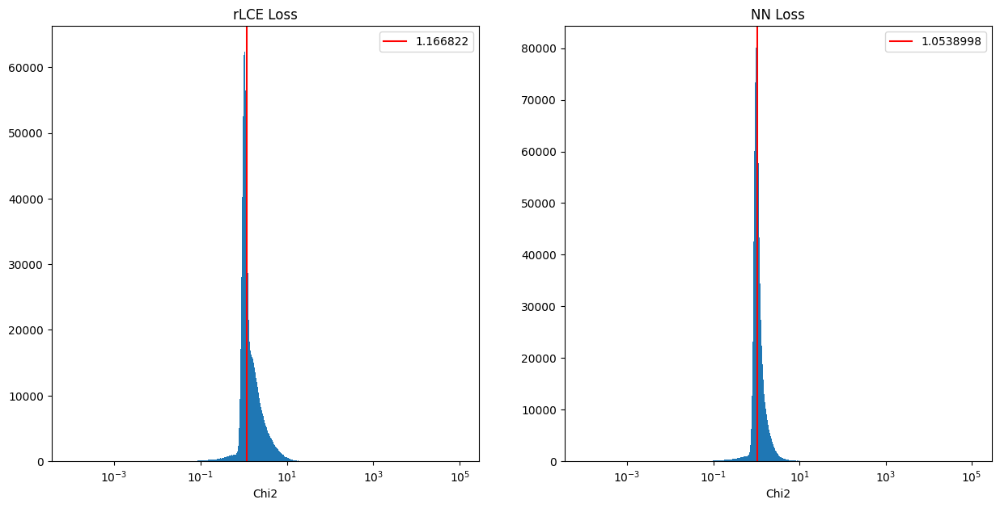

In [25]:
fig, ax = plt.subplots(1,2,figsize=(15,7))
x_bins = np.logspace(-4, np.log10(np.nanmax(all_data_df['rLCE_Loss'][all_data_df['filter']])), bins)
ax[0].hist(all_data_df['rLCE_Loss'][all_data_df['filter']], bins=x_bins)
ax[0].set_xscale('log')
median = np.sort(all_data_df['rLCE_Loss'][all_data_df['filter']])[len(all_data_df['rLCE_Loss'][all_data_df['filter']])//2]
ax[0].axvline(median, c='r', label=str(median))
ax[0].legend()
ax[0].set_xlabel('Chi2')
ax[0].set_title('rLCE Loss')

x_bins = np.logspace(-4, np.log10(np.nanmax(all_data_df['NN_Loss'][all_data_df['filter']])), bins)
ax[1].hist(all_data_df['NN_Loss'][all_data_df['filter']], bins=x_bins)
ax[1].set_xscale('log')
median = np.sort(all_data_df['NN_Loss'][all_data_df['filter']])[len(all_data_df['NN_Loss'][all_data_df['filter']])//2]
ax[1].axvline(median, c='r', label=str(median))
ax[1].legend()
ax[1].set_xlabel('Chi2')
ax[1].set_title('NN Loss')

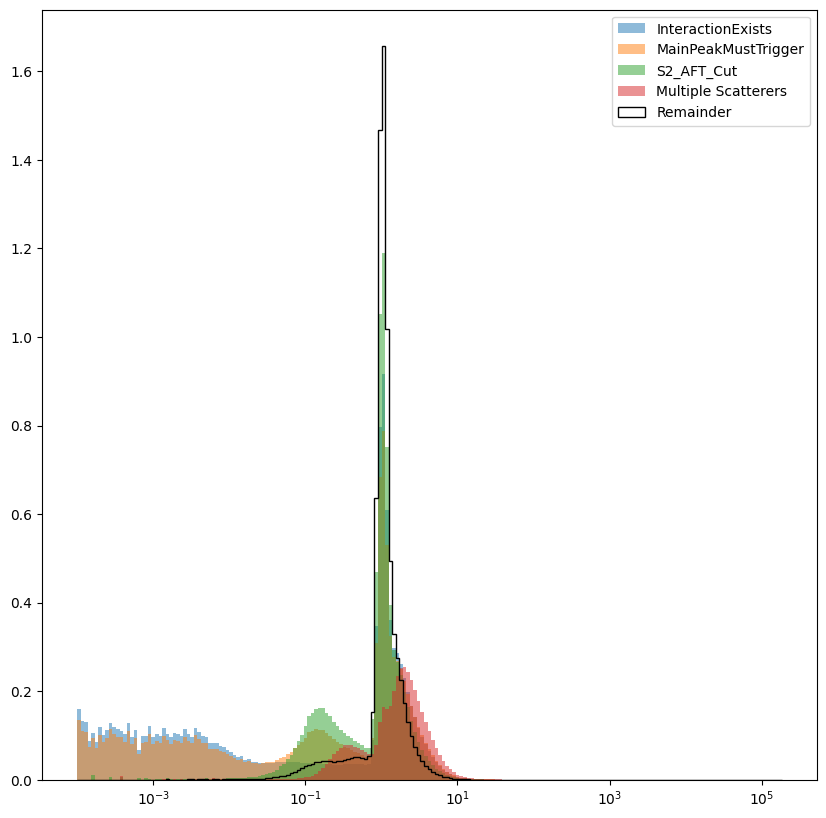

In [26]:
# Lets see Quality Cuts
plt.figure(figsize=(10,10))
x_bins = np.logspace(-4, np.log10(np.nanmax(all_data_df['rLCE_Loss'])), 200)

for i in ('InteractionExists', 'MainPeakMustTrigger', 'S2_AFT_Cut'):
    plt.hist(all_data_df.loc[all_data_df[i], 'rLCE_Loss'],bins=x_bins,alpha=0.5,label=i, density = True)

plt.hist(all_data_df.loc[~all_data_df['single_scatters'], 'rLCE_Loss'],bins=x_bins,alpha=0.5,label='Multiple Scatterers', density = True)
plt.hist(all_data_df.loc[all_data_df['filter'], 'rLCE_Loss'],bins=x_bins,alpha=1,color='black',histtype='step',label="Remainder", density = True)
plt.legend()
plt.xscale('log')

## Identify some populations in cs1 and cs2 -> Look at their behavior and distributions

Ah this is pointless, im just going to use the two lines I drew on the plot

### Noise Pop (Low cS1)

Two distinct populations - Mainly it seems due to S2 Area - Low Area Events more susceptible to noise? Or is it a distinctly different event?

Filter all with S2 Area < 2e3 and cS1 < 2e2



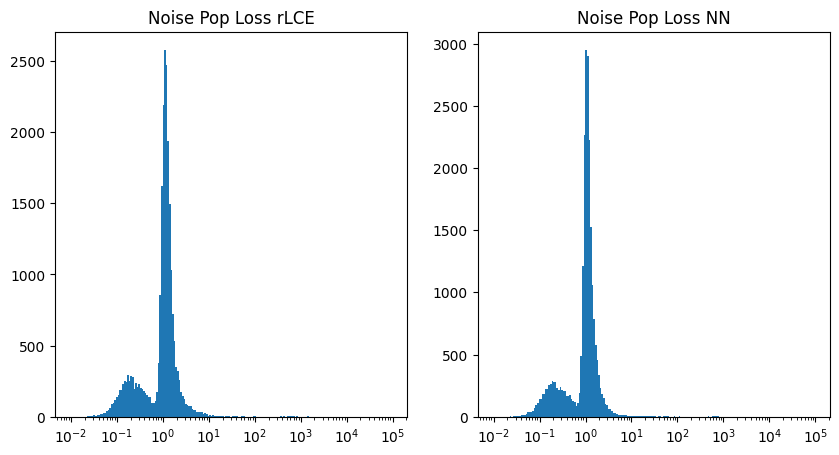

In [331]:
# Lets start with the noise pop
noise_pop_bmap = (all_data_df['filter'] & (all_data_df['cs1']<2e2))
subset = all_data_df['rLCE_Loss'][noise_pop_bmap]
x_bins = np.logspace(-2, np.log10(np.nanmax(subset)), bin_cnt)

fig, ax = plt.subplots(1,2,figsize=(10,5))
ax[0].set_title('Noise Pop Loss rLCE')
ax[0].set_xscale('log')
ax[0].hist(subset,bins=x_bins)

subset = all_data_df['NN_Loss'][noise_pop_bmap]
ax[1].set_title('Noise Pop Loss NN')
ax[1].set_xscale('log')
ax[1].hist(subset,bins=x_bins)

plt.show()
del subset

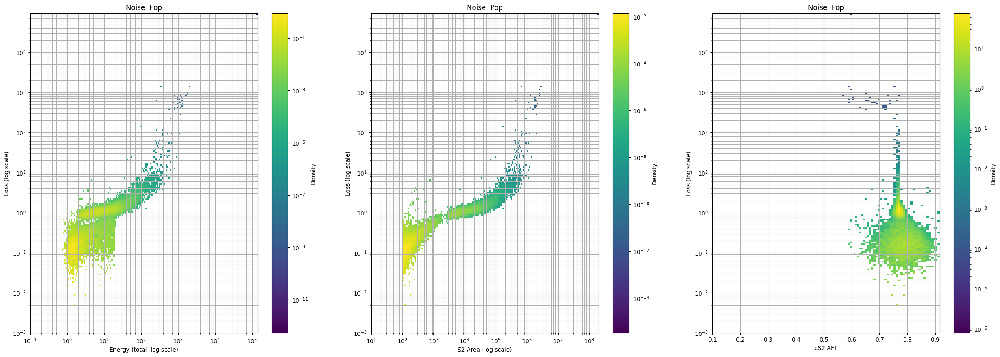

In [332]:
fig,ax = plt.subplots(1,3,figsize=(30,10))
# Define log-spaced bins for both axes
x_bins = np.logspace(-3, np.log10(np.nanmax(all_data_df['rLCE_Loss'][noise_pop_bmap])), bin_cnt)
y_bins = np.logspace(-1, np.log10(np.nanmax(all_data_df['e_ces'][noise_pop_bmap])), bin_cnt)


# Create 2D histogram
h = ax[0].hist2d(all_data_df['e_ces'][noise_pop_bmap], all_data_df['rLCE_Loss'][noise_pop_bmap], bins=[y_bins, x_bins], density=True, cmap='viridis', norm=LogNorm())

# Set log scales for both axes
ax[0].set_yscale('log')
ax[0].set_xscale('log')

# Add titles and grid
ax[0].set_title("Noise  Pop")
ax[0].set_ylabel('Loss (log scale)')
ax[0].set_xlabel('Energy (total, log scale)')
ax[0].grid(True,which='both')#, which='both', linestyle='--', linewidth=0.5
# Add colorbar for the histogram
plt.colorbar(h[3], ax=ax[0], label='Density')

y_bins = np.logspace(1, np.log10(np.nanmax(all_data_df['s2_area'][noise_pop_bmap])), bin_cnt)
h = ax[1].hist2d(all_data_df['s2_area'][noise_pop_bmap], all_data_df['rLCE_Loss'][noise_pop_bmap], bins=[y_bins, x_bins], density=True, cmap='viridis', norm=LogNorm())
ax[1].set_yscale('log')
ax[1].set_xscale('log')
ax[1].set_title("Noise  Pop")
ax[1].set_ylabel('Loss (log scale)')
ax[1].set_xlabel('S2 Area (log scale)')
ax[1].grid(True,which='both')#, which='both', linestyle='--', linewidth=0.5
plt.colorbar(h[3], ax=ax[1], label='Density')


y_bins = np.logspace(-1, np.log10(np.nanmax(all_data_df['cs2_area_fraction_top'][noise_pop_bmap])), bin_cnt)
h = ax[2].hist2d(all_data_df['cs2_area_fraction_top'][noise_pop_bmap], all_data_df['rLCE_Loss'][noise_pop_bmap], bins=[y_bins, x_bins], density=True, cmap='viridis', norm=LogNorm())
ax[2].set_yscale('log')
ax[2].set_title("Noise  Pop")
ax[2].set_ylabel('Loss (log scale)')
ax[2].set_xlabel('cS2 AFT')
ax[2].grid(True,which='both')#, which='both', linestyle='--', linewidth=0.5
plt.colorbar(h[3], ax=ax[2], label='Density')

In [333]:
noise_pop_low_s2_area = (noise_pop_bmap & (all_data_df['s2_area'] < 2e3))
remainder_bmap = (noise_pop_bmap & (all_data_df['rLCE_Loss'] < 1e2) & (all_data_df['s2_area'] > 2e3))

1.2123114


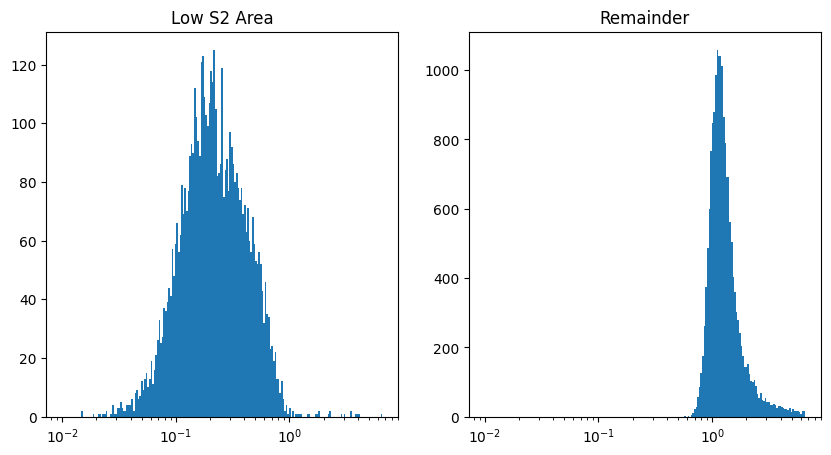

In [334]:
fig, ax = plt.subplots(1,2,figsize=(10,5))

i=0
x_bins = np.logspace(-2, np.log10(np.nanmax(all_data_df['rLCE_Loss'][noise_pop_low_s2_area])), bin_cnt)
ax[i].set_title('Low S2 Area')
ax[i].set_xscale('log')
ax[i].hist(all_data_df['rLCE_Loss'][noise_pop_low_s2_area],bins=x_bins)

i+= 1
#x_bins = np.logspace(-1, np.log10(np.nanmax(all_data_df['rLCE_Loss'][remainder_bmap])), bin_cnt)
ax[i].set_title('Remainder')
ax[i].set_xscale('log')
ax[i].hist(all_data_df['rLCE_Loss'][remainder_bmap],bins=x_bins)

print(np.sort(all_data_df['rLCE_Loss'][remainder_bmap])[remainder_bmap.sum()//2])
plt.show()

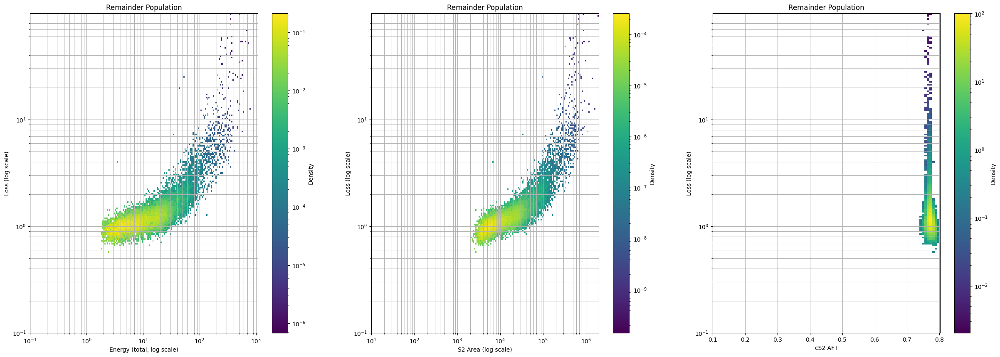

In [335]:
fig,ax = plt.subplots(1,3,figsize=(30,10))
bmap = remainder_bmap
title="Remainder Population"
# Define log-spaced bins for both axes
x_bins = np.logspace(-1, np.log10(np.nanmax(all_data_df['rLCE_Loss'][bmap])), bin_cnt)
y_bins = np.logspace(-1, np.log10(np.nanmax(all_data_df['e_ces'][bmap])), bin_cnt)


# Create 2D histogram
h = ax[0].hist2d(all_data_df['e_ces'][bmap], all_data_df['rLCE_Loss'][bmap], bins=[y_bins, x_bins], density=True, cmap='viridis', norm=LogNorm())

# Set log scales for both axes
ax[0].set_yscale('log')
ax[0].set_xscale('log')

# Add titles and grid
ax[0].set_title(title)
ax[0].set_ylabel('Loss (log scale)')
ax[0].set_xlabel('Energy (total, log scale)')
ax[0].grid(True,which='both')#, which='both', linestyle='--', linewidth=0.5
# Add colorbar for the histogram
plt.colorbar(h[3], ax=ax[0], label='Density')

y_bins = np.logspace(1, np.log10(np.nanmax(all_data_df['s2_area'][bmap])), bin_cnt)
h = ax[1].hist2d(all_data_df['s2_area'][bmap], all_data_df['rLCE_Loss'][bmap], bins=[y_bins, x_bins], density=True, cmap='viridis', norm=LogNorm())
ax[1].set_yscale('log')
ax[1].set_xscale('log')
ax[1].set_title(title)
ax[1].set_ylabel('Loss (log scale)')
ax[1].set_xlabel('S2 Area (log scale)')
ax[1].grid(True,which='both')#, which='both', linestyle='--', linewidth=0.5
plt.colorbar(h[3], ax=ax[1], label='Density')


y_bins = np.logspace(-1, np.log10(np.nanmax(all_data_df['cs2_area_fraction_top'][bmap])), bin_cnt)
h = ax[2].hist2d(all_data_df['cs2_area_fraction_top'][bmap], all_data_df['rLCE_Loss'][bmap], bins=[y_bins, x_bins], density=True, cmap='viridis', norm=LogNorm())
ax[2].set_yscale('log')
ax[2].set_title(title)
ax[2].set_ylabel('Loss (log scale)')
ax[2].set_xlabel('cS2 AFT')
ax[2].grid(True,which='both')#, which='both', linestyle='--', linewidth=0.5
plt.colorbar(h[3], ax=ax[2], label='Density')

### 2e4-4e4 && 4e4-7e4 
Grouping to the right of the main branch

No Idea what they are but they seem to be similar events with reasonable patterns based on chi squared, however, looking at the patterns they are more spread out than we would expect

In [336]:
cs2, cs1 = (2e4,4e4), (4e4,7e4) 
rofMain_bmap = (all_data_df['filter'] & (all_data_df['cs1']<cs1[1]) & (all_data_df['cs1']>cs1[0]) & (all_data_df['cs2']<cs2[1]) & (all_data_df['cs2']>cs2[0]))

1.3318931
1.1376377


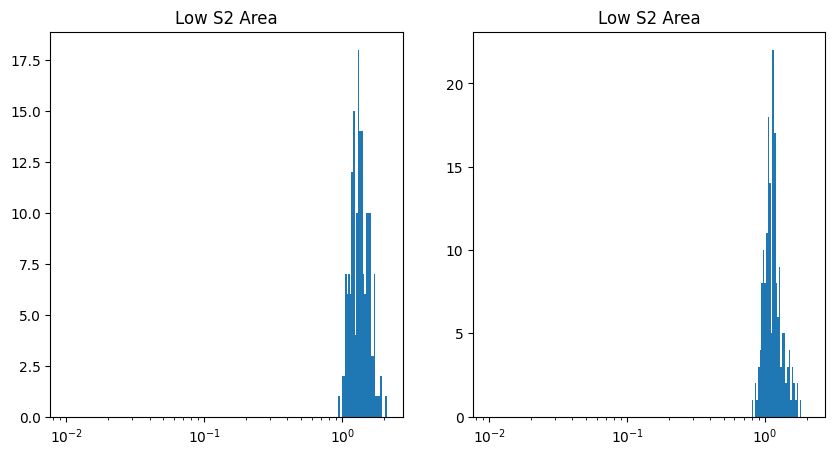

In [343]:
fig, ax = plt.subplots(1,2,figsize=(10,5))

i=0
x_bins = np.logspace(-2, np.log10(np.nanmax(all_data_df['rLCE_Loss'][rofMain_bmap])), bin_cnt)
ax[i].set_title('Low S2 Area')
ax[i].set_xscale('log')
ax[i].hist(all_data_df['rLCE_Loss'][rofMain_bmap],bins=x_bins)

i+= 1
x_bins = np.logspace(-2, np.log10(np.nanmax(all_data_df['rLCE_Loss'][rofMain_bmap])), bin_cnt)
ax[i].set_title('Low S2 Area')
ax[i].set_xscale('log')
ax[i].hist(all_data_df['NN_Loss'][rofMain_bmap],bins=x_bins)

print(np.sort(all_data_df['rLCE_Loss'][rofMain_bmap])[rofMain_bmap.sum()//2])
print(np.sort(all_data_df['NN_Loss'][rofMain_bmap])[rofMain_bmap.sum()//2])
plt.show()

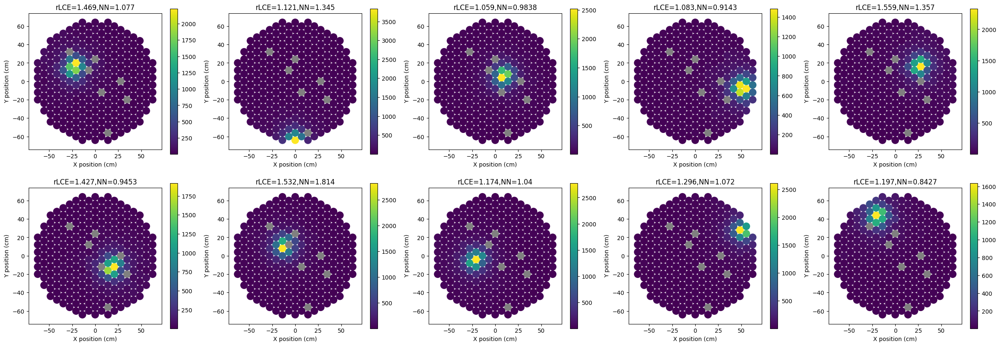

In [351]:
true_indices = np.where(rofMain_bmap)[0]

# Select 10 random indices from the true indices
# If there are fewer than 10 True values, you can adjust the number of samples
n_samples = min(10, len(true_indices))  # Ensure we don't sample more than available
random_indices = np.random.choice(true_indices, n_samples, replace=False)
del true_indices

fig,ax = plt.subplots(2,5,figsize=(30,10))

ax = ax.flatten()

for i in range(len(ax)):
    plot_pmt_response(pmt_pos_top, all_data_df['s2_area_per_channel'].iloc[random_indices[i]], ax=ax[i], title="rLCE={:.4},NN={:.4}".format(all_data_df['rLCE_Loss'].iloc[random_indices[i]],all_data_df['NN_Loss'].iloc[random_indices[i]]), dead_pmts=dead_pmts)

## Identified a number of populations that give a poor fit on the data for reasons listed above

Now cut them

Low S1 Area Noise

And just lines about the main branch

In [37]:
def LowS1AreaNoisePopCut(events):
    cs1 = 2e2  
    s2_area =2e3
    return ~((events['cs1']<cs1) & (events['s2_area']<2e3))

all_data_df['LowS1AreaCut_Custom']=LowS1AreaNoisePopCut(all_data_df)

In [38]:
def LineCut(events):
    def upper_bound(x):
        return 8.6 * x**(1.38)
    def lower_bound(x):
        return 2.4 * x**(1.20)

    y_upper = upper_bound(all_data_df['cs1'])
    y_lower = lower_bound(all_data_df['cs1'])
    return ((all_data_df['cs2'] > y_lower) &
            (all_data_df['cs2'] < y_upper))

line_cut = LineCut(all_data_df)
all_data_df['filter'].loc[line_cut].sum(),

(4096228,)

In [56]:
tmp_bmap = (all_data_df['filter'] & 1)
tmp_bmap &= line_cut & all_data_df['LowS1AreaCut_Custom'] #& (all_data_df['e_ces'] <1e4)
tmp_bmap2 = tmp_bmap.copy()


Text(0.5, 1.0, 'NN Loss')

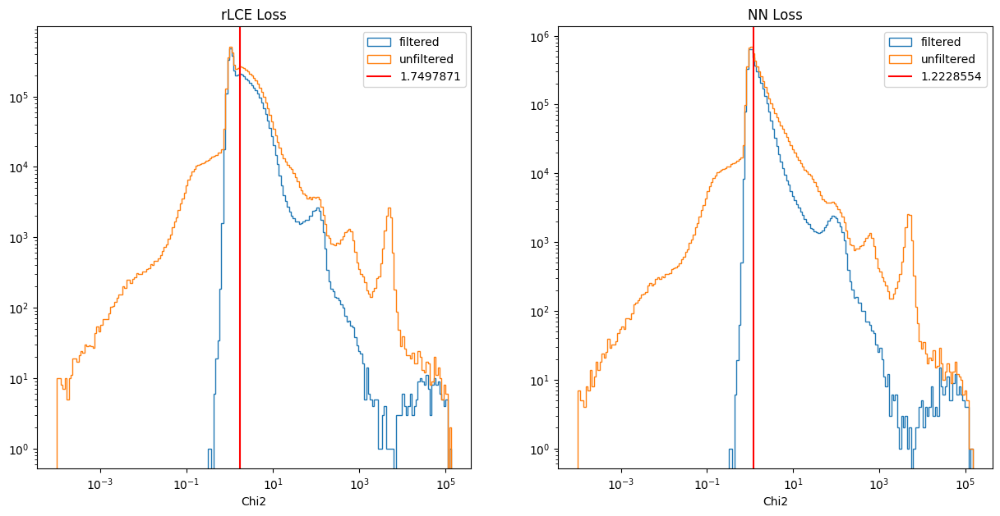

In [58]:
fig, ax = plt.subplots(1,2,figsize=(15,7))
bins = 200
x_bins = np.logspace(-4, np.log10(np.nanmax(all_data_df['rLCE_Loss'][tmp_bmap])), bins)
ax[0].hist(all_data_df['rLCE_Loss'][tmp_bmap], histtype = 'step', bins=x_bins,label='filtered')
ax[0].hist(all_data_df['rLCE_Loss'], histtype = 'step', bins=x_bins,label='unfiltered')
ax[0].set_xscale('log')
median = np.sort(all_data_df['rLCE_Loss'][tmp_bmap])[len(all_data_df['rLCE_Loss'][tmp_bmap])//2]
ax[0].axvline(median, c='r', label=str(median))
ax[0].legend()
ax[0].set_yscale('log')
ax[0].set_xlabel('Chi2')
ax[0].set_title('rLCE Loss')

x_bins = np.logspace(-4, np.log10(np.nanmax(all_data_df['NN_Loss'][tmp_bmap])), bins)
ax[1].hist(all_data_df['NN_Loss'][tmp_bmap],histtype = 'step', bins=x_bins,label='filtered')
ax[1].hist(all_data_df['NN_Loss'],histtype = 'step', bins=x_bins,label='unfiltered')
ax[1].set_xscale('log')
median = np.sort(all_data_df['NN_Loss'][tmp_bmap])[len(all_data_df['NN_Loss'][tmp_bmap])//2]
ax[1].axvline(median, c='r', label=str(median))
ax[1].legend()
ax[1].set_yscale('log')
ax[1].set_xlabel('Chi2')
ax[1].set_title('NN Loss')

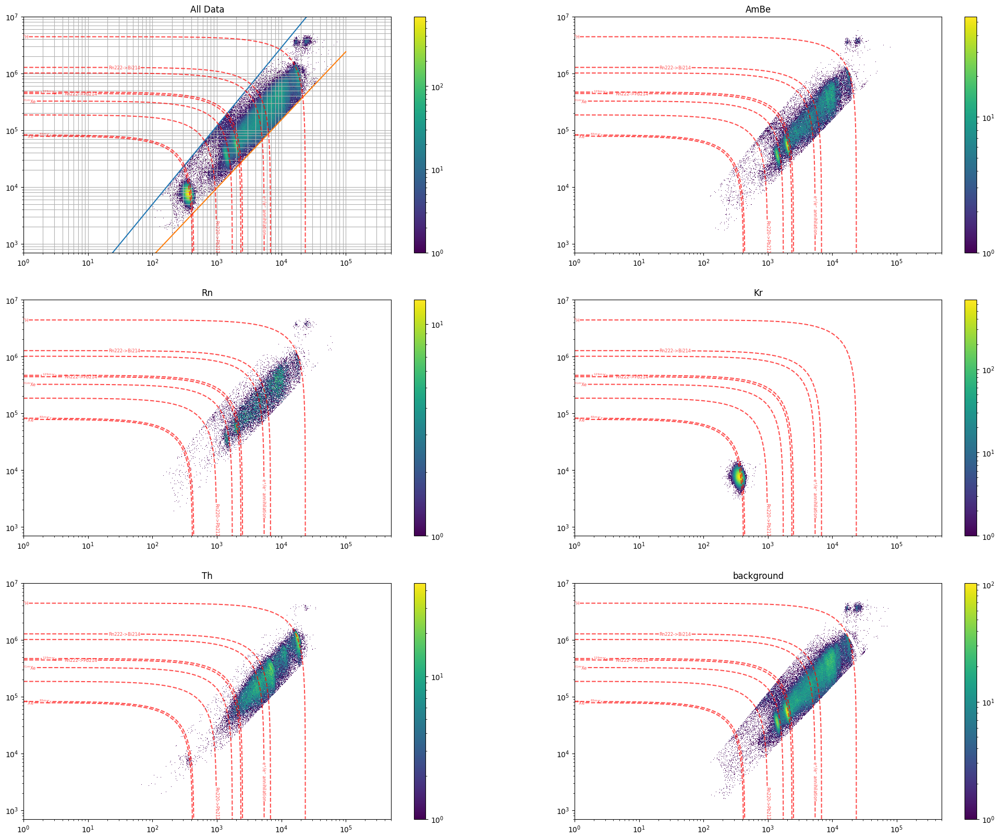

In [45]:
## CS1 CS2 Plot
from matplotlib.colors import LogNorm
fig = plt.figure(figsize=(25,20))
#2,3,
ax = []
ax.append(plt.subplot(3, 2, 1))
ax.append(plt.subplot(3, 2, 2))
ax.append(plt.subplot(3, 2, 3))
ax.append(plt.subplot(3, 2, 4))
ax.append(plt.subplot(3, 2, 5))
ax.append(plt.subplot(3, 2, 6))
# Constants 

bin_cnt = 200
# Taken from https://github.com/XENONnT/analysiscode/blob/master/g1g2_analysis/Full_cs1cs2_Plot/Full_Range_Plot.ipynb
AmBeIn_energy = 39.6
ar37_energy = 2.82
kr83m_energy = 41.5575
xe131m_energy = 163.930
xe129m_energy = 236.140
annih_energy = 510.999
bi214_energy = [609.320, 1764.491, 2204.059]  # To be completed when more stat.
co60_energy = [1173.228, 1332.492]
k40_energy = 1460.820
tl208_energy = 2614.511
h2_energy = 2224.52
c12_energy = 4400
# Isotope labels
AmBeIn_label = '$^{129}$Xe'
ar37_label = '$^{37}$Ar'
kr83m_label = '$^{83\mathregular{m}}$Kr'
xe131m_label = '$^{131\mathregular{m}}$Xe'
xe129m_label = '$^{129\mathregular{m}}$Xe'
annih_label = 'e$^{+}$/e$^{-}$ annihilation'
bi214_label = '$^{214}$Bi'
co60_label = '$^{60}$Co'
k40_label = '$^{40}$K'
tl208_label = '$^{208}$Tl'
h2_label = "$^{2}$H"
c12_label = "$^{12}$C"
def E_ces(cs1, cs2, g1, g2):
    w = 0.0137  # Is this value accurate enough?
    return w * (cs1 / g1 + cs2 / g2)

labels = {
    93.5: 'Rn220->Pb212',
    223: 'Rn222->Pb214',
    642: 'Rn222->Bi214',
    xe131m_energy: xe131m_label,
    xe129m_energy: xe129m_label,
    h2_energy: h2_label,
    annih_energy: annih_label,
    kr83m_energy: kr83m_label,
    AmBeIn_energy: AmBeIn_label, 
    }
levels =sorted(list(labels.keys()))

min_cs1 = 1e0
max_cs1 = 5e5
min_cs2 = 7e2
max_cs2 = 1e7
g1 = straxen.URLConfig(
        default="bodega://g1?bodega_version=v2",
        help="S1 gain in PE / photons produced",
    )
g1 =g1.eval("bodega://g1?bodega_version=v2")
g2 = straxen.URLConfig(
        default="bodega://g2?bodega_version=v2",
        help="S2 gain in PE / electrons produced",
    )
g2 = g2.eval("bodega://g2?bodega_version=v2")


#Generate CES lines
x = np.geomspace(min_cs1, max_cs1, 1000)
y = np.geomspace(min_cs2, max_cs2, 1000)  
xx, yy = np.meshgrid(x, y)
ces_grid = E_ces(xx, yy, g1, g2)

bins=2000
x_bins = np.logspace(np.log10(min_cs1), np.log10(max_cs1), bins)
y_bins = np.logspace(np.log10(min_cs2), np.log10(max_cs2), bins)

##                  ALL DATA Plot
density, x_edges, y_edges = np.histogram2d(all_data_df['cs1'][tmp_bmap], all_data_df['cs2'][tmp_bmap], bins=[x_bins, y_bins])
mesh = ax[0].pcolormesh(x_edges, y_edges, density.T, cmap='viridis', norm=LogNorm())
cbar = plt.colorbar(mesh, ax=ax[0])
ax[0].set_xlim(min_cs1, max_cs1)
ax[0].set_ylim(min_cs2, max_cs2)
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_title('All Data')
ax[0].grid(which='both')

tst_x = np.logspace(0,5,2000)
tst_y = 8.6*tst_x**(1.38)
ax[0].plot(tst_x,tst_y)
tst_y = 2.4*tst_x**(1.20)
ax[0].plot(tst_x,tst_y)

CS = ax[0].contour(x, y, ces_grid, levels = levels,#[10, 100, 500, 1000, 2000, 3000],
            colors="r",alpha=0.7, linestyles = "dashed", 
            )
ax[0].clabel(CS, #CS.levels,#['Rn220->Pb212','Rn222->Pb214', 'Rn222->Bi214'],
        inline=True,
        fmt=labels,
        fontsize=6,
        inline_spacing=1,
        )
ax[0].set_ylim(min_cs2,max_cs2)
ax[0].set_xlim(min_cs1,max_cs1)

##                  Partial Data Plot
for j, key in enumerate(('AmBe', 'Rn', 'Kr', 'Th', 'background')):
    i=j+1
    density, x_edges, y_edges = np.histogram2d(all_data_df['cs1'][ tmp_bmap & (all_data_df['Source']==key) ], all_data_df['cs2'][ tmp_bmap & (all_data_df['Source']==key)], bins=[x_bins, y_bins])
    mesh = ax[i].pcolormesh(x_edges, y_edges, density.T, cmap='viridis', norm=LogNorm())
    cbar = plt.colorbar(mesh, ax=ax[i])
    ax[i].set_xlim(min_cs1, max_cs1)
    ax[i].set_ylim(min_cs2, max_cs2)
    ax[i].set_xscale('log')
    ax[i].set_yscale('log')
    ax[i].set_title(key)
    CS = ax[i].contour(x, y, ces_grid, levels = levels,#[10, 100, 500, 1000, 2000, 3000],
                colors="r",alpha=0.7, linestyles = "dashed", 
                )
    ax[i].clabel(CS, #CS.levels,#['Rn220->Pb212','Rn222->Pb214', 'Rn222->Bi214'],
            inline=True,
            fmt=labels,
            fontsize=6,
            inline_spacing=1,
            )

plt.show()

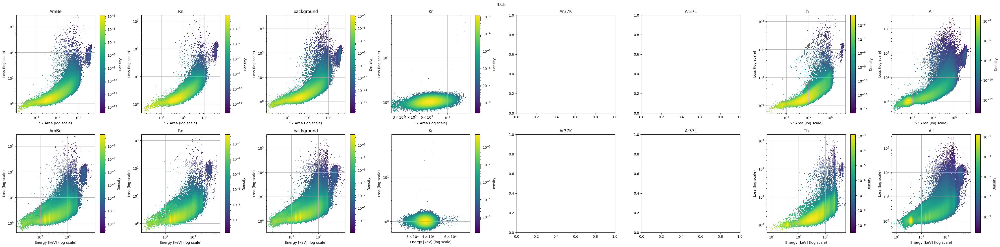

In [46]:
import matplotlib.pyplot as plt 
from matplotlib.colors import LogNorm
fig, ax = plt.subplots(2,8,figsize=(40,10)) 
bin_cnt = 200

for i, key in enumerate(('AmBe', 'Rn', 'background', 'Kr', 'Ar37K', 'Ar37L','Th', '')):  # Iterate over dataset keys
    # Extract filtered values
    try:
        tmp_bmap = ( tmp_bmap2 & 1 ) # &1 makes a copy
        if key != '':
            tmp_bmap &=  (all_data_df['Source']==key) 
        s2_area = all_data_df['s2_area'][tmp_bmap]
        loss = all_data_df['rLCE_Loss'][tmp_bmap]
        
        # Define log-spaced bins for both axes
        x_bins = np.logspace(np.log10(np.nanmin(loss[loss > 0])), np.log10(np.nanmax(loss)), bin_cnt)
        y_bins = np.logspace(np.log10(np.nanmin(s2_area[s2_area > 0])), np.log10(np.nanmax(s2_area)), bin_cnt)
        
        # Create 2D histogram
        h = ax[0,i].hist2d(s2_area, loss, bins=[y_bins, x_bins], density=True, cmap='viridis', norm=LogNorm())
        
        # Set log scales for both axes
        ax[0,i].set_xscale('log')
        ax[0,i].set_yscale('log')
        key = key if key!='' else 'All'
        # Add titles and grid
        ax[0,i].set_title(key)
        ax[0,i].set_ylabel('Loss (log scale)')
        ax[0,i].set_xlabel('S2 Area (log scale)')
        ax[0,i].grid(True)#, which='both', linestyle='--', linewidth=0.5
        # Add colorbar for the histogram
        plt.colorbar(h[3], ax=ax[0,i], label='Density')

        #And Energy plot
        s2_area = all_data_df['e_ces'][tmp_bmap]
        y_bins = np.logspace(np.log10(np.nanmin(s2_area[s2_area > 0])), np.log10(np.nanmax(s2_area)), bin_cnt)
        
        # Create 2D histogram
        h = ax[1,i].hist2d(s2_area, loss, bins=[y_bins, x_bins], density=True, cmap='viridis', norm=LogNorm())
        
        # Set log scales for both axes
        ax[1,i].set_xscale('log')
        ax[1,i].set_yscale('log')
        key = key if key!='' else 'All'
        # Add titles and grid
        ax[1,i].set_title(key)
        ax[1,i].set_ylabel('Loss (log scale)')
        ax[1,i].set_xlabel('Energy [keV] (log scale)')
        ax[1,i].grid(True)#, which='both', linestyle='--', linewidth=0.5
        
        # Add colorbar for the histogram
        plt.colorbar(h[3], ax=ax[1,i], label='Density')
    except:
        key = key if key!='' else 'All'
        ax[0,i].set_title(key)
        ax[1,i].set_title(key)
        pass
fig.suptitle('rLCE')
# Show the plot
plt.tight_layout()
plt.show()


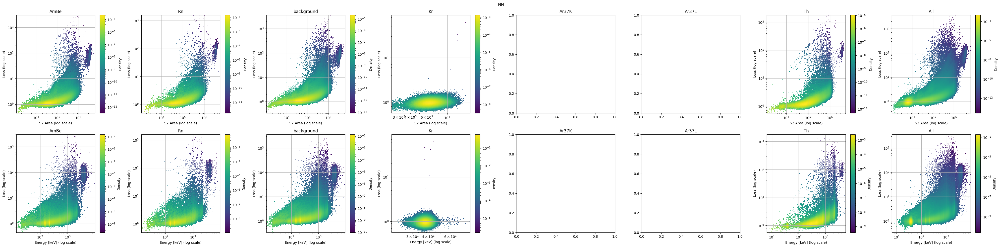

In [48]:
import matplotlib.pyplot as plt 
from matplotlib.colors import LogNorm
fig, ax = plt.subplots(2,8,figsize=(40,10)) 
bin_cnt = 200

for i, key in enumerate(('AmBe', 'Rn', 'background', 'Kr', 'Ar37K', 'Ar37L', 'Th', '')):  # Iterate over dataset keys
    # Extract filtered values
    try:
        tmp_bmap = ( tmp_bmap2 & 1 ) # &1 makes a copy
        if key != '':
            tmp_bmap &=  (all_data_df['Source']==key) 
        s2_area = all_data_df['s2_area'][tmp_bmap]
        loss = all_data_df['NN_Loss'][tmp_bmap]
        
        # Define log-spaced bins for both axes
        x_bins = np.logspace(np.log10(np.nanmin(loss[loss > 0])), np.log10(np.nanmax(loss)), bin_cnt)
        y_bins = np.logspace(np.log10(np.nanmin(s2_area[s2_area > 0])), np.log10(np.nanmax(s2_area)), bin_cnt)
        
        # Create 2D histogram
        h = ax[0,i].hist2d(s2_area, loss, bins=[y_bins, x_bins], density=True, cmap='viridis', norm=LogNorm())
        
        # Set log scales for both axes
        ax[0,i].set_xscale('log')
        ax[0,i].set_yscale('log')
        key = key if key!='' else 'All'
        # Add titles and grid
        ax[0,i].set_title(key)
        ax[0,i].set_ylabel('Loss (log scale)')
        ax[0,i].set_xlabel('S2 Area (log scale)')
        ax[0,i].grid(True)#, which='both', linestyle='--', linewidth=0.5
        # Add colorbar for the histogram
        plt.colorbar(h[3], ax=ax[0,i], label='Density')

        #And Energy plot
        s2_area = all_data_df['e_ces'][tmp_bmap]
        y_bins = np.logspace(np.log10(np.nanmin(s2_area[s2_area > 0])), np.log10(np.nanmax(s2_area)), bin_cnt)
        
        # Create 2D histogram
        h = ax[1,i].hist2d(s2_area, loss, bins=[y_bins, x_bins], density=True, cmap='viridis', norm=LogNorm())
        
        # Set log scales for both axes
        ax[1,i].set_xscale('log')
        ax[1,i].set_yscale('log')
        key = key if key!='' else 'All'
        # Add titles and grid
        ax[1,i].set_title(key)
        ax[1,i].set_ylabel('Loss (log scale)')
        ax[1,i].set_xlabel('Energy [keV] (log scale)')
        ax[1,i].grid(True)#, which='both', linestyle='--', linewidth=0.5
        
        # Add colorbar for the histogram
        plt.colorbar(h[3], ax=ax[1,i], label='Density')
    except:
        key = key if key!='' else 'All'
        ax[0,i].set_title(key)
        ax[1,i].set_title(key)
        pass
fig.suptitle('NN')
# Show the plot
plt.tight_layout()
plt.show()


### Equi Area test

I still feel the way we compute chi squared is off. Since we only predict patterns I wonder if it wouldnt be more correct to utilize a fixed energy range say direct percentage values 

In [18]:
tmp_pat = np.vstack(all_data_df['s2_area_per_channel'].to_numpy()).astype('float32')
tmp_pat /= tmp_pat.sum(axis=-1).reshape(-1,1)
tmp_pat *= 1e2
tmp_pos = np.vstack(all_data_df['position'].to_numpy()).astype('float32')
equi_energy_pred_rlce = radial_mc.predict({'xx':tmp_pos, 'yy':tmp_pat})[1]
equi_energy_pred_nn = model_chi2.predict({'xx':tmp_pos, 'yy':tmp_pat})[1]

/tmp/ipykernel_939/129732680.py:2: RuntimeWarning: invalid value encountered in divide
  tmp_pat /= tmp_pat.sum(axis=-1).reshape(-1,1)


172228/172228 [==============================] - 413s 2ms/step


0.0045845914
0.0066412757


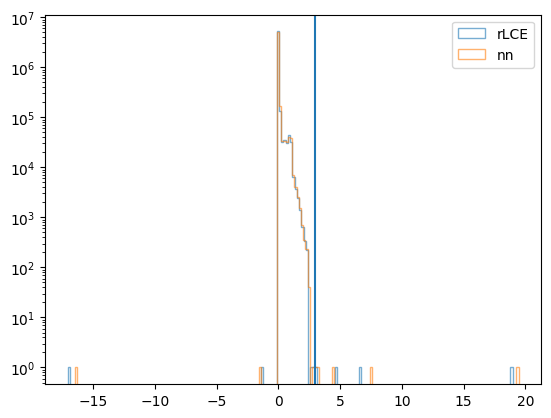

In [53]:
plt.hist(equi_energy_pred_rlce, histtype='step', bins=200,alpha=0.6,label='rLCE')
plt.hist(equi_energy_pred_nn, histtype='step', bins=200,alpha=0.6,label='nn')
print(np.sort(equi_energy_pred_rlce)[len(equi_energy_pred_rlce)//2])
print(np.sort(equi_energy_pred_nn)[len(equi_energy_pred_rlce)//2])
plt.axvline(3)
plt.legend()
plt.yscale('log')

In [57]:
tmp_bmap &= (equi_energy_pred_rlce < 3)

In [23]:
len(equi_energy_pred_rlce), equi_energy_pred_nn.shape

(5511295, (5511295,))

1.8613945
1.294614


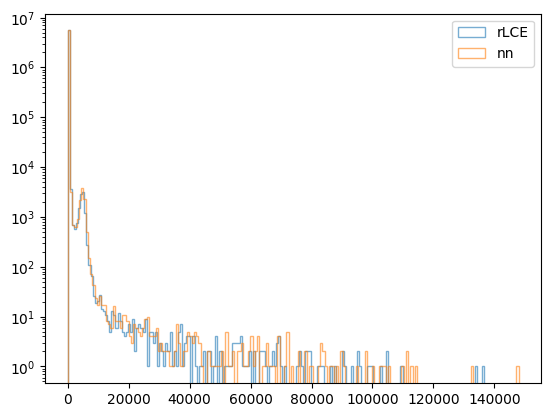

In [24]:
plt.hist(all_data_df['rLCE_Loss'], histtype='step', bins=200,alpha=0.6,label='rLCE')
plt.hist(all_data_df['NN_Loss'], histtype='step', bins=200,alpha=0.6,label='nn')
print(np.sort(all_data_df['rLCE_Loss'])[len(equi_energy_pred_rlce)//2])
print(np.sort(all_data_df['NN_Loss'])[len(equi_energy_pred_rlce)//2])
plt.legend()
plt.yscale('log')

1.8613945
1.294614


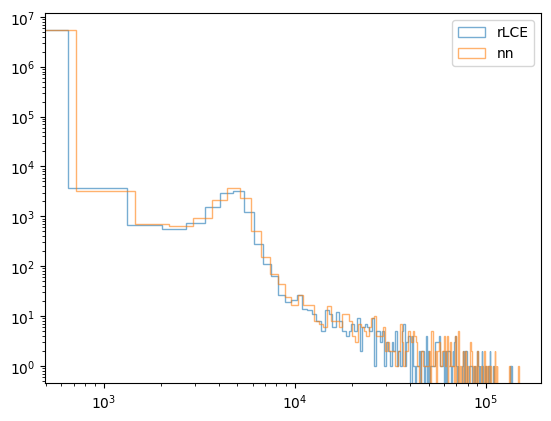

In [25]:
plt.hist(all_data_df['rLCE_Loss'], histtype='step', bins=200,alpha=0.6,label='rLCE')
plt.hist(all_data_df['NN_Loss'], histtype='step', bins=200,alpha=0.6,label='nn')
print(np.sort(all_data_df['rLCE_Loss'])[len(equi_energy_pred_rlce)//2])
print(np.sort(all_data_df['NN_Loss'])[len(equi_energy_pred_rlce)//2])
plt.legend()
plt.yscale('log')
plt.xscale('log')

# Miscellaneous plotting

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [2]:
file_path = "/Code/processed_data/all_data.pkl.gz"
all_data_df = pd.read_pickle(file_path, compression="gzip")

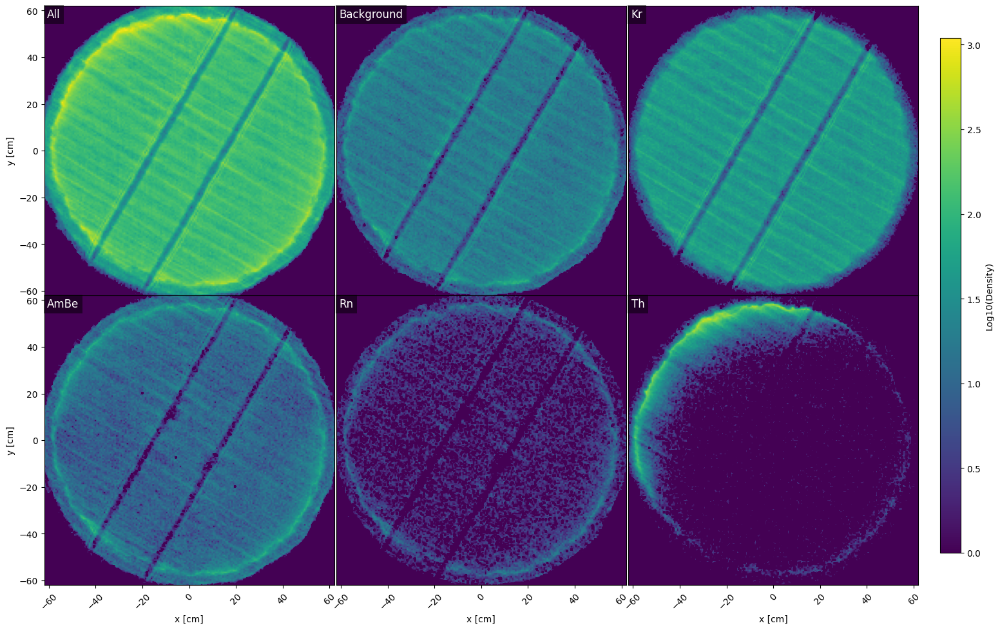

In [45]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.gridspec as gridspec

# Assuming all_data_df['position'] and all_data_df['filter'] are defined
fig = plt.figure(figsize=(16, 10))
gs = gridspec.GridSpec(2, 3, figure=fig, wspace=0, hspace=0)  # No space between plots

# Create subplots
ax = [fig.add_subplot(gs[i // 3, i % 3], sharex=ax[0] if i % 3 != 0 else None, sharey=ax[0] if i >= 3 else None) for i in range(6)]

# Flatten positions
pos = np.array(all_data_df['position'].to_list())

# Collect all heatmap data for normalization
heatmap_max = -np.inf
heatmaps = []
edges = []

for key in ('All', 'Background', 'Kr', 'AmBe', 'Rn', 'Th'):  # Iterate over dataset keys
    tmp_bmap = (all_data_df['filter'] & 1)  # &1 makes a copy
    if key != 'All':
        tmp_bmap &= (all_data_df['Source'] == key)

    _x, _y = pos[tmp_bmap, 0], pos[tmp_bmap, 1]
    heatmap_data, x_edges, y_edges = np.histogram2d(_x, _y, bins=200)
    heatmaps.append(np.log10(heatmap_data + 1e-10))  # Avoid log(0)
    edges.append((x_edges, y_edges))
    heatmap_max = max(heatmap_max, np.max(heatmaps[-1]))  # Update global max for normalization

# Plot heatmaps
for i, key in enumerate(('All', 'Background', 'Kr', 'AmBe', 'Rn', 'Th')):
    img = ax[i].imshow(
        heatmaps[i].T,
        extent=[edges[i][0][0], edges[i][0][-1], edges[i][1][0], edges[i][1][-1]],
        origin='lower',
        cmap='viridis',
        aspect='equal',
        vmin=0, vmax=heatmap_max
    )
    ax[i].set_xlim(-62, 62)
    ax[i].set_ylim(-62, 62)
    ax[i].text(
        0.01, 0.99, key,
        transform=ax[i].transAxes,
        fontsize=12,
        va='top', ha='left',
        color='white',
        bbox=dict(facecolor='black', alpha=0.5, edgecolor='none')
    )
    # Remove redundant ticks
    if i % 3 != 0:  # Not in the first column
        ax[i].yaxis.set_visible(False)
    if i < 3:  # Not in the last row
        ax[i].xaxis.set_visible(False)

# Add shared colorbar
cbar_ax = fig.add_axes([0.92, 0.1, 0.02, 0.8])  # Position for the colorbar
fig.colorbar(img, cax=cbar_ax, label='Log10(Density)')

for axis in ax:
    for label in axis.get_xticklabels():
        label.set_rotation(45) 

ax[0].set_ylabel("y [cm]")
ax[3].set_ylabel("y [cm]")
ax[3].set_xlabel("x [cm]")
ax[4].set_xlabel("x [cm]")
ax[5].set_xlabel("x [cm]")

plt.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.05)  # Tighten layout
plt.show()


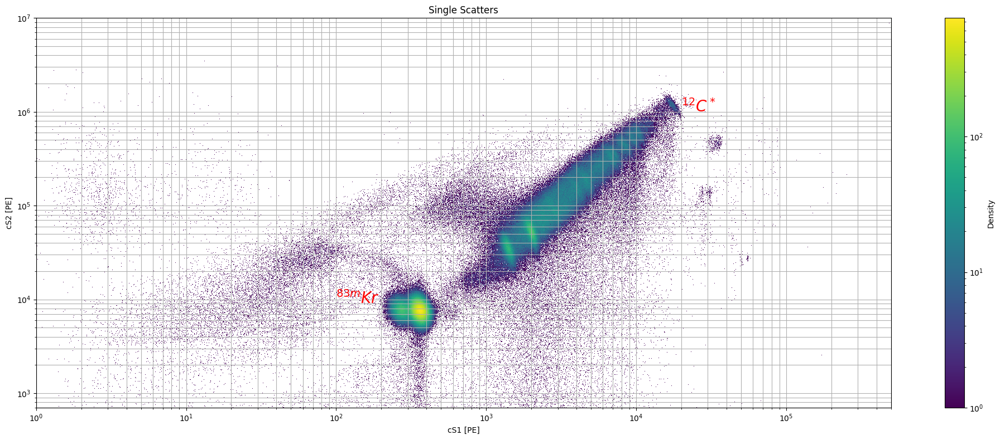

In [83]:
from matplotlib.colors import LogNorm
fig, ax = plt.subplots(1,1,figsize=(20,8))
ax=[ax]

bin_cnt = 200
# Taken from https://github.com/XENONnT/analysiscode/blob/master/g1g2_analysis/Full_cs1cs2_Plot/Full_Range_Plot.ipynb
AmBeIn_energy = 39.6
ar37_energy = 2.82
kr83m_energy = 41.5575
xe131m_energy = 163.930
xe129m_energy = 236.140
annih_energy = 510.999
bi214_energy = [609.320, 1764.491, 2204.059]  # To be completed when more stat.
co60_energy = [1173.228, 1332.492]
k40_energy = 1460.820
tl208_energy = 2614.511
h2_energy = 2224.52
c12_energy = 4400
# Isotope labels
AmBeIn_label = '$^{129}$Xe'
ar37_label = '$^{37}$Ar'
kr83m_label = '$^{83\mathregular{m}}$Kr'
xe131m_label = '$^{131\mathregular{m}}$Xe'
xe129m_label = '$^{129\mathregular{m}}$Xe'
annih_label = 'e$^{+}$/e$^{-}$ annihilation'
bi214_label = '$^{214}$Bi'
co60_label = '$^{60}$Co'
k40_label = '$^{40}$K'
tl208_label = '$^{208}$Tl'
h2_label = "$^{2}$H"
c12_label = "$^{12}$C"
def E_ces(cs1, cs2, g1, g2):
    w = 0.0137  # Is this value accurate enough?
    return w * (cs1 / g1 + cs2 / g2)

labels = {
    93.5: 'Rn220->Pb212',
    223: 'Rn222->Pb214',
    642: 'Rn222->Bi214',
    xe131m_energy: xe131m_label,
    xe129m_energy: xe129m_label,
    h2_energy: h2_label,
    annih_energy: annih_label,
    kr83m_energy: kr83m_label,
    AmBeIn_energy: AmBeIn_label, 
    }
levels =sorted(list(labels.keys()))

min_cs1 = 1e0
max_cs1 = 5e5
min_cs2 = 7e2
max_cs2 = 1e7
g1 = straxen.URLConfig(
        default="bodega://g1?bodega_version=v2",
        help="S1 gain in PE / photons produced",
    )
g1 =g1.eval("bodega://g1?bodega_version=v2")
g2 = straxen.URLConfig(
        default="bodega://g2?bodega_version=v2",
        help="S2 gain in PE / electrons produced",
    )
g2 = g2.eval("bodega://g2?bodega_version=v2")


#Generate CES lines
x = np.geomspace(min_cs1, max_cs1, 1000)
y = np.geomspace(min_cs2, max_cs2, 1000)  
xx, yy = np.meshgrid(x, y)
ces_grid = E_ces(xx, yy, g1, g2)

bins=2000
x_bins = np.logspace(np.log10(min_cs1), np.log10(max_cs1), bins)
y_bins = np.logspace(np.log10(min_cs2), np.log10(max_cs2), bins)

##                  ALL DATA Plot
density, x_edges, y_edges = np.histogram2d(all_data_df['cs1'][all_data_df['filter']], all_data_df['cs2'][all_data_df['filter']], bins=[x_bins, y_bins])
mesh = ax[0].pcolormesh(x_edges, y_edges, density.T, cmap='viridis', norm=LogNorm())
cbar = plt.colorbar(mesh, ax=ax[0], label="Density")
ax[0].set_xlim(min_cs1, max_cs1)
ax[0].set_ylim(min_cs2, max_cs2)
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_title('Single Scatters')
ax[0].grid(which='both')

#tst_x = np.logspace(0,5,2000)
#tst_y = 8.6*tst_x**(1.38)
#ax[0].plot(tst_x,tst_y)
#tst_y = 2.4*tst_x**(1.20)
#ax[0].plot(tst_x,tst_y)
#
#CS = ax[0].contour(x, y, ces_grid, levels = levels,#[10, 100, 500, 1000, 2000, 3000],
#            colors="r",alpha=0.7, linestyles = "dashed", 
#            )
#ax[0].clabel(CS, #CS.levels,#['Rn220->Pb212','Rn222->Pb214', 'Rn222->Bi214'],
#        inline=True,
#        fmt=labels,
#        fontsize=6,
#        inline_spacing=1,
#        )
ax[0].set_ylim(min_cs2,max_cs2)
ax[0].set_xlabel('cS1 [PE]')
ax[0].set_ylabel('cS2 [PE]')
ax[0].set_xlim(min_cs1,max_cs1)

ax[0].text(2e4, 1e6, r"$^{12}C^*$", fontsize=20, color = "red")
ax[0].text(1e2, 9e3, r"$^{83m}Kr$", fontsize=20, color = "red")

plt.tight_layout()

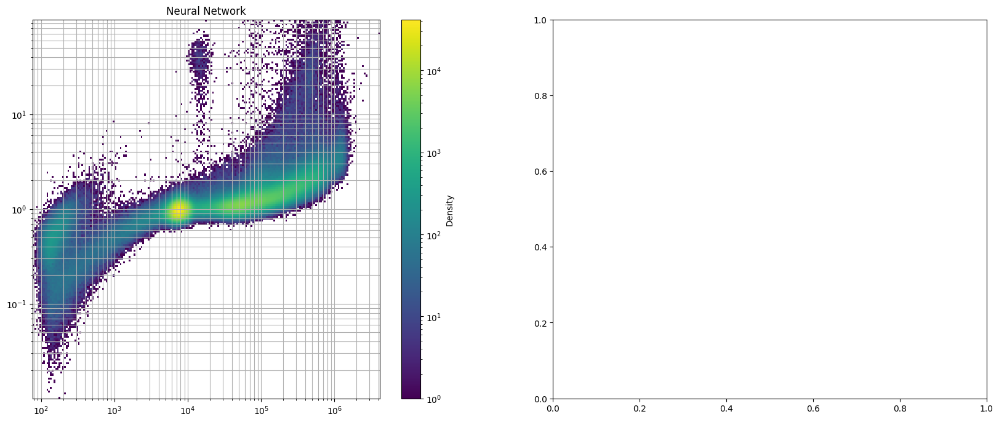

In [109]:
fig, ax = plt.subplots(1,2,figsize=(20,8))
bins=200
bmap = ~np.isnan(all_data_df['cs2']) & ~np.isnan(all_data_df['NN_Loss']) & all_data_df['filter'] & (all_data_df['NN_Loss'] < 100) & (all_data_df['NN_Loss'] > 0.01)
x_bins = np.logspace(np.log10(np.nanmin(all_data_df['cs2'][bmap])), np.log10(np.nanmax(all_data_df['cs2'][bmap])), bins)
y_bins = np.logspace(np.log10(np.nanmin(all_data_df['NN_Loss'][bmap])), np.log10(np.nanmax(all_data_df['NN_Loss'][bmap])), bins)

##                  ALL DATA Plot
density, x_edges, y_edges = np.histogram2d(all_data_df['cs2'][all_data_df['filter']], all_data_df['NN_Loss'][all_data_df['filter']], bins=[x_bins, y_bins])
mesh = ax[0].pcolormesh(x_edges, y_edges, density.T, cmap='viridis', norm=LogNorm())
cbar = plt.colorbar(mesh, ax=ax[0], label="Density")
ax[0].set_xlim(x_bins[0], x_bins[-1])
ax[0].set_ylim(y_bins[0], y_bins[-1])
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_title('Neural Network')
ax[0].grid(which='both')


bmap = ~np.isnan(all_data_df['cs2']) & ~np.isnan(all_data_df['NN_Loss']) & all_data_df['filter'] & (all_data_df['NN_Loss'] < 100) & (all_data_df['NN_Loss'] > 0.01)
x_bins = np.logspace(np.log10(np.nanmin(all_data_df['cs2'][bmap])), np.log10(np.nanmax(all_data_df['cs2'][bmap])), bins)
y_bins = np.logspace(np.log10(np.nanmin(all_data_df['NN_Loss'][bmap])), np.log10(np.nanmax(all_data_df['NN_Loss'][bmap])), bins)

##                  ALL DATA Plot
density, x_edges, y_edges = np.histogram2d(all_data_df['cs2'][all_data_df['filter']], all_data_df['NN_Loss'][all_data_df['filter']], bins=[x_bins, y_bins])
mesh = ax[0].pcolormesh(x_edges, y_edges, density.T, cmap='viridis', norm=LogNorm())
cbar = plt.colorbar(mesh, ax=ax[0], label="Density")
ax[0].set_xlim(x_bins[0], x_bins[-1])
ax[0].set_ylim(y_bins[0], y_bins[-1])
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_title('Neural Network')
ax[0].grid(which='both')

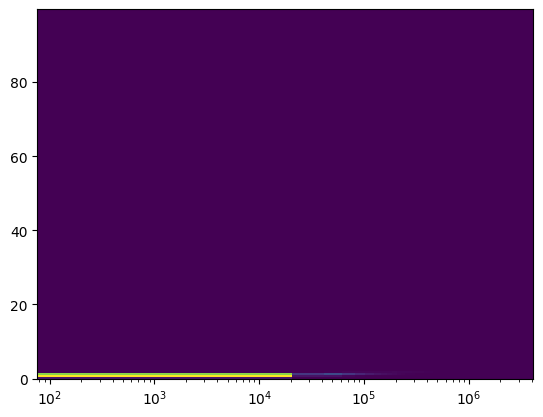

In [105]:
bmap = ~np.isnan(all_data_df['cs2']) & ~np.isnan(all_data_df['NN_Loss']) & all_data_df['filter'] & (all_data_df['NN_Loss'] < 100)
plt.hist2d(all_data_df['cs2'][bmap], all_data_df['NN_Loss'][bmap],bins=200)
plt.xscale('log')